# ATAC processing using ArchR

# Load data

In [1]:
library(ArchR)
library(parallel)
library(Seurat)
addArchRThreads(threads = 16) 
addArchRGenome('hg19')

Loading required package: ggplot2

Warning message:
“package ‘ggplot2’ was built under R version 4.1.3”
Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats

Warning message:
“package ‘matrixStats’ was built under R version 4.1.3”

Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    r

In [2]:
.libPaths("/mnt/home/icb/laura.martens/miniconda3/envs/archr/lib/R/library")
library(Signac)

Warning message:
“package ‘Signac’ was built under R version 4.1.3”


In [3]:
data_path <- "/storage/groups/ml01/workspace/laura.martens/moretti_colab/archr_final/"

In [4]:
setwd(data_path)

In [5]:
7

[1] 7

In [6]:
proj <- loadArchRProject(path = paste0(data_path, "Epicardiods"))

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [7]:
proj


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /storage/groups/ml01/workspace/laura.martens/moretti_colab/archr_final/Epicardiods 
samples(7): MUC26649_1234 MUC26650_1234 ... MUC26654_1234 MUC26655_1234
sampleColData names(1): ArrowFiles
cellColData names(18): Sample TSSEnrichment ... ReadsInPeaks FRIP
numberOfCells(1): 39738
medianTSS(1): 15.6275
medianFrags(1): 10360

In [15]:
library(stringr)
cellnames <- as.data.frame(str_split(getCellNames(proj), '#', simplify=TRUE))
colnames(cellnames) <- c('sample', 'barcode')

In [17]:
write.csv(cellnames, '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/archr_final/barcodes.csv')

In [8]:
embedding <- getReducedDims(
      ArchRProj = proj, 
      reducedDims = "IterativeLSI", 
      dimsToUse = NULL, 
      corCutOff = 0.75, 
      scaleDims = NULL
  )

In [35]:
colData <- as.data.frame(getCellColData(proj)) %>% mutate(day=recode(Sample, 
                         'MUC26649_1234'="day2",
                         'MUC26650_1234'="day3",
                         'MUC26651_1234'="day4",
                         'MUC26652_1234'="day5",
                         'MUC26653_1234'="day7",
                         'MUC26654_1234'="day10",
                         'MUC26655_1234'="day15"))

In [40]:
proj$day = colData$day

# Analyse unfiltered data

In [27]:
arrow_files <- list.files(pattern="arrow")

In [28]:
arrow_files

[1] "MUC26649_1234.arrow" "MUC26650_1234.arrow" "MUC26651_1234.arrow"
[4] "MUC26652_1234.arrow" "MUC26653_1234.arrow" "MUC26654_1234.arrow"
[7] "MUC26655_1234.arrow"

In [29]:
proj <- ArchRProject(
  ArrowFiles = arrow_files,
  outputDirectory = "Epicardiods_unfiltered",
  copyArrows = TRUE,
  geneAnnotation = getGeneAnnotation(),
  genomeAnnotation = getGenomeAnnotation(),
  showLogo = TRUE,
  threads = getArchRThreads()
)



Using GeneAnnotation set by addArchRGenome(Hg19)!

Using GeneAnnotation set by addArchRGenome(Hg19)!

Validating Arrows...

Getting SampleNames...



Copying ArrowFiles to Ouptut Directory! If you want to save disk space set copyArrows = FALSE

1 
2 
3 
4 
5 
6 
7 


Getting Cell Metadata...



Merging Cell Metadata...

Initializing ArchRProject...


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\


In [30]:
proj


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /storage/groups/ml01/workspace/laura.martens/moretti_colab/archr_new/Epicardiods_unfiltered 
samples(7): MUC26649_1234 MUC26650_1234 ... MUC26654_1234 MUC26655_1234
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 147358
medianTSS(1): 4.455
medianFrags(1): 726

In [16]:
proj <- loadArchRProject(path = paste0(data_path, "Epicardiods"))

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [5]:
getAvailableMatrices(proj)

[1] "GeneScoreMatrix" "PeakMatrix"      "TileMatrix"

# Plot Quality metrics

## TSS enrichment

1 
Warning message:
“`expand_scale()` is deprecated; use `expansion()` instead.”


Picking joint bandwidth of 1.12

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


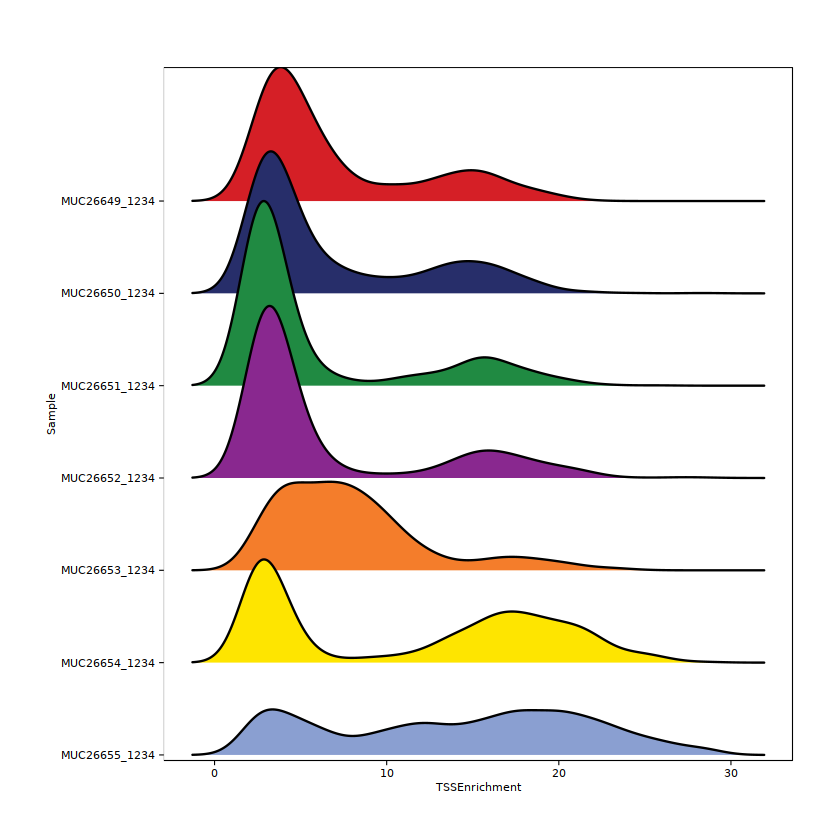

In [31]:
p1 <- plotGroups(
    ArchRProj = proj, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "ridges"
   )
p1

## Fragment numbers

1 
Warning message:
“`expand_scale()` is deprecated; use `expansion()` instead.”


Picking joint bandwidth of 0.0917

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


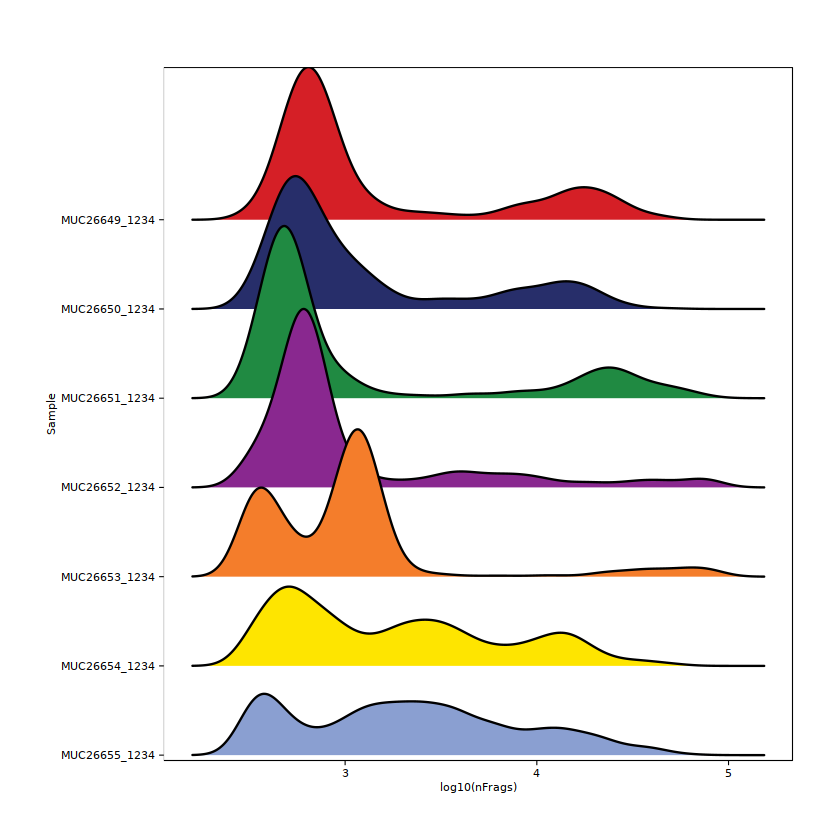

In [32]:
p2 <- plotGroups(
    ArchRProj = proj, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "ridges"
   )
p2

## Fragment size distribution

ArchR logging to : ArchRLogs/ArchR-plotFragmentSizes-72ca4b4e8f4d-Date-2022-05-27_Time-11-06-28.log
If there is an issue, please report to github with logFile!

2022-05-27 11:06:31 : MUC26649_1234 Computing FragmentSizes (1 of 7)!, 0.056 mins elapsed.

2022-05-27 11:13:53 : MUC26649_1234 Finished Computing FragmentSizes (1 of 7)!, 7.42 mins elapsed.

2022-05-27 11:13:53 : MUC26650_1234 Computing FragmentSizes (2 of 7)!, 7.422 mins elapsed.

2022-05-27 11:20:13 : MUC26650_1234 Finished Computing FragmentSizes (2 of 7)!, 13.756 mins elapsed.

2022-05-27 11:20:13 : MUC26651_1234 Computing FragmentSizes (3 of 7)!, 13.757 mins elapsed.

2022-05-27 11:26:57 : MUC26651_1234 Finished Computing FragmentSizes (3 of 7)!, 20.483 mins elapsed.

2022-05-27 11:26:57 : MUC26652_1234 Computing FragmentSizes (4 of 7)!, 20.484 mins elapsed.

2022-05-27 11:33:08 : MUC26652_1234 Finished Computing FragmentSizes (4 of 7)!, 26.676 mins elapsed.

2022-05-27 11:33:08 : MUC26653_1234 Computing FragmentSizes (5 

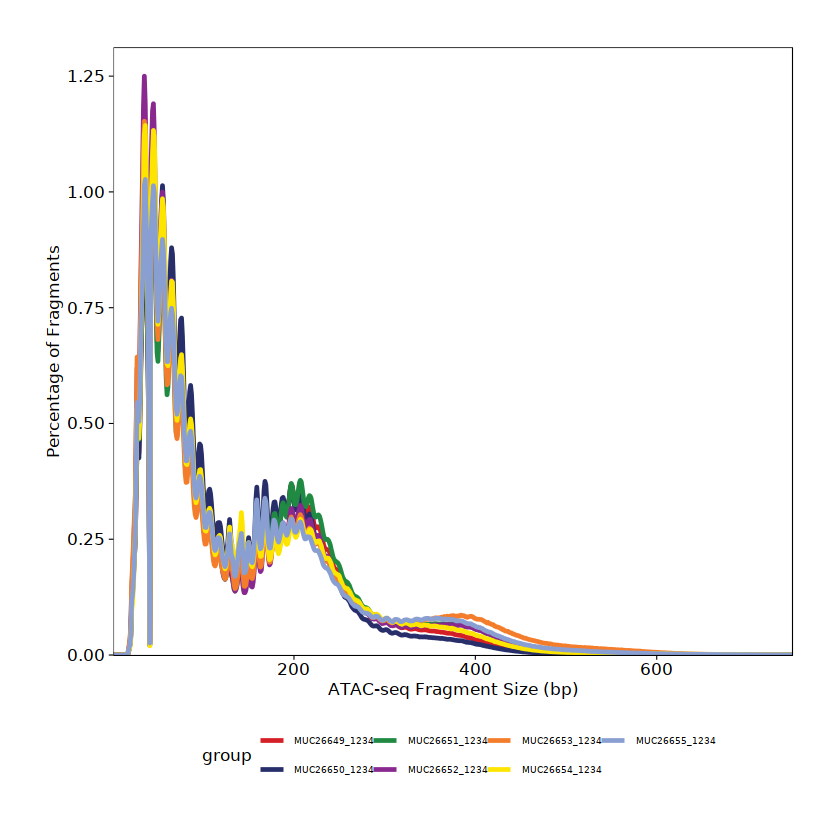

In [15]:
p1 <- plotFragmentSizes(ArchRProj = proj)
p1

In [41]:
p2 <- plotTSSEnrichment(ArchRProj = proj)
p2

ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b16fc115c-Date-2022-05-27_Time-21-10-15.log
If there is an issue, please report to github with logFile!



## TSS enrichment per sample

In [43]:
plots <- list()
for(sample in unique(proj$Sample)){
    print(sample)
    idxSample <- BiocGenerics::which(proj$Sample %in% sample)
    cellsSample <- proj$cellNames[idxSample]

    proj_sample <- proj[cellsSample, ]

    p1 <- plotTSSEnrichment(ArchRProj = proj_sample)
    plots[[sample]] <- p1
        }

[1] "MUC26649_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b180de9b2-Date-2022-05-27_Time-21-12-05.log
If there is an issue, please report to github with logFile!

2022-05-27 21:12:07 : MUC26649_1234 Computing TSS (1 of 1)!, 0.04 mins elapsed.

2022-05-27 21:19:07 : MUC26649_1234 Finished Computing TSS (1 of 1)!, 7.034 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326b180de9b2-Date-2022-05-27_Time-21-12-05.log



[1] "MUC26651_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326bc86bb73-Date-2022-05-27_Time-21-19-07.log
If there is an issue, please report to github with logFile!

2022-05-27 21:19:10 : MUC26651_1234 Computing TSS (1 of 1)!, 0.043 mins elapsed.

2022-05-27 21:24:08 : MUC26651_1234 Finished Computing TSS (1 of 1)!, 5.002 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326bc86bb73-Date-2022-05-27_Time-21-19-07.log



[1] "MUC26650_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b155fb396-Date-2022-05-27_Time-21-24-08.log
If there is an issue, please report to github with logFile!

2022-05-27 21:24:10 : MUC26650_1234 Computing TSS (1 of 1)!, 0.039 mins elapsed.

2022-05-27 21:29:21 : MUC26650_1234 Finished Computing TSS (1 of 1)!, 5.21 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326b155fb396-Date-2022-05-27_Time-21-24-08.log



[1] "MUC26652_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b220eb096-Date-2022-05-27_Time-21-29-21.log
If there is an issue, please report to github with logFile!

2022-05-27 21:29:24 : MUC26652_1234 Computing TSS (1 of 1)!, 0.044 mins elapsed.

2022-05-27 21:31:24 : MUC26652_1234 Finished Computing TSS (1 of 1)!, 2.04 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326b220eb096-Date-2022-05-27_Time-21-29-21.log



[1] "MUC26654_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b6114ae90-Date-2022-05-27_Time-21-31-24.log
If there is an issue, please report to github with logFile!

2022-05-27 21:31:27 : MUC26654_1234 Computing TSS (1 of 1)!, 0.041 mins elapsed.

2022-05-27 21:33:25 : MUC26654_1234 Finished Computing TSS (1 of 1)!, 2.012 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326b6114ae90-Date-2022-05-27_Time-21-31-24.log



[1] "MUC26655_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b55b54861-Date-2022-05-27_Time-21-33-25.log
If there is an issue, please report to github with logFile!

2022-05-27 21:33:28 : MUC26655_1234 Computing TSS (1 of 1)!, 0.042 mins elapsed.

2022-05-27 21:35:19 : MUC26655_1234 Finished Computing TSS (1 of 1)!, 1.895 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326b55b54861-Date-2022-05-27_Time-21-33-25.log



[1] "MUC26653_1234"


ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-326b4bcb8bc4-Date-2022-05-27_Time-21-35-19.log
If there is an issue, please report to github with logFile!

2022-05-27 21:35:22 : MUC26653_1234 Computing TSS (1 of 1)!, 0.044 mins elapsed.

2022-05-27 21:36:35 : MUC26653_1234 Finished Computing TSS (1 of 1)!, 1.262 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-326b4bcb8bc4-Date-2022-05-27_Time-21-35-19.log



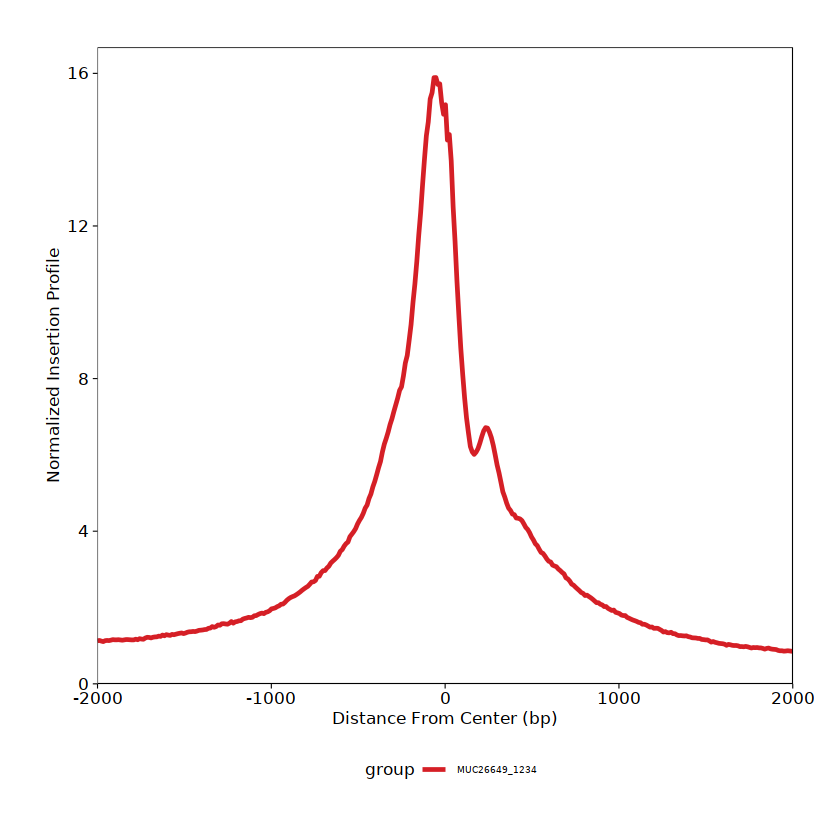

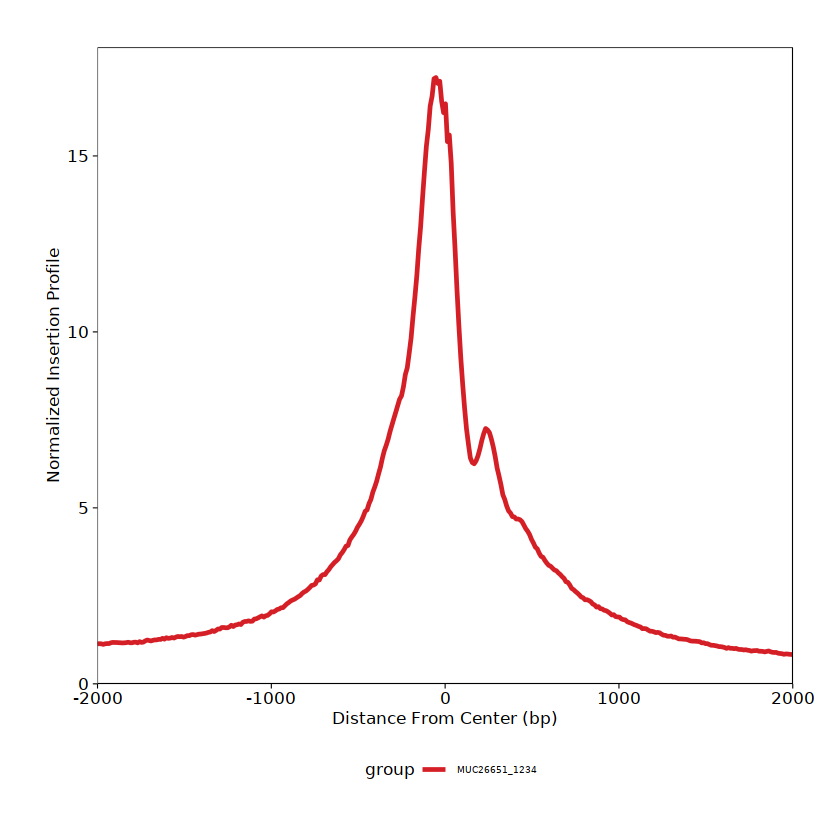

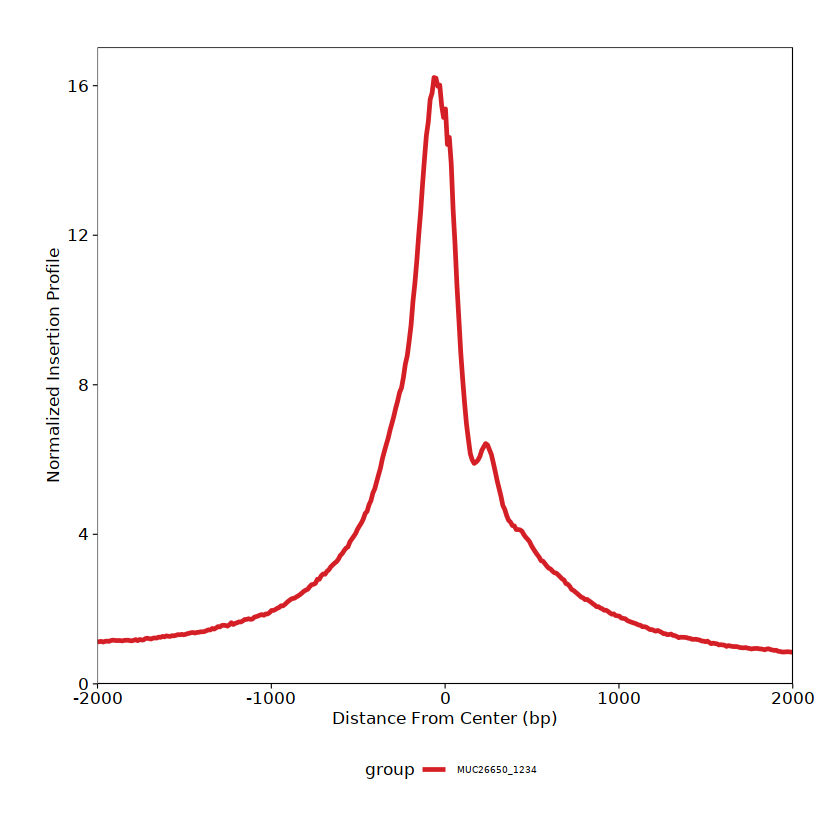

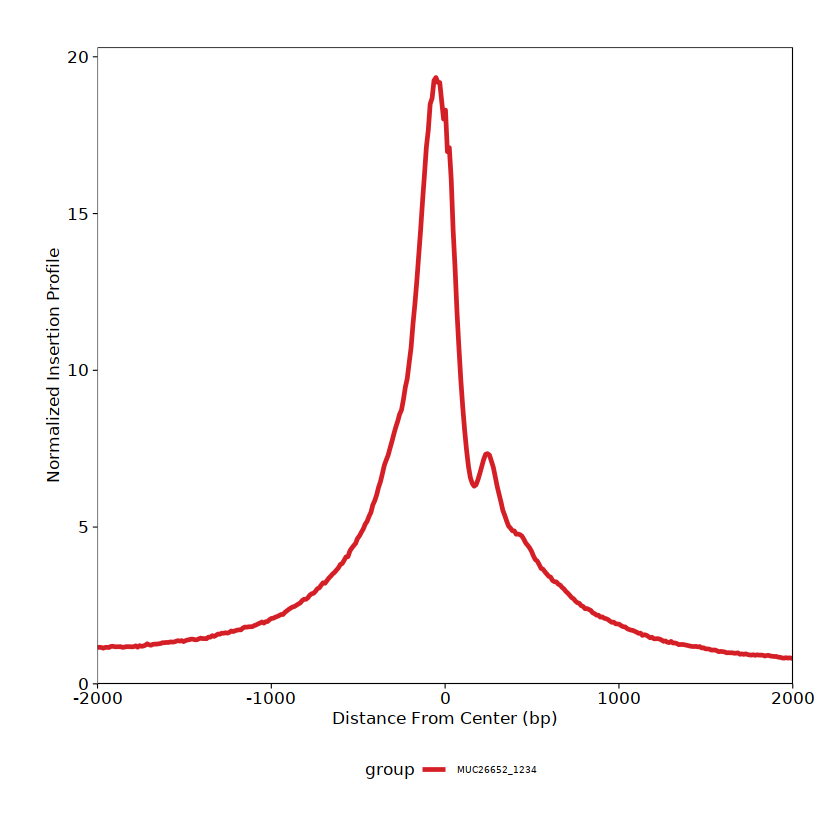

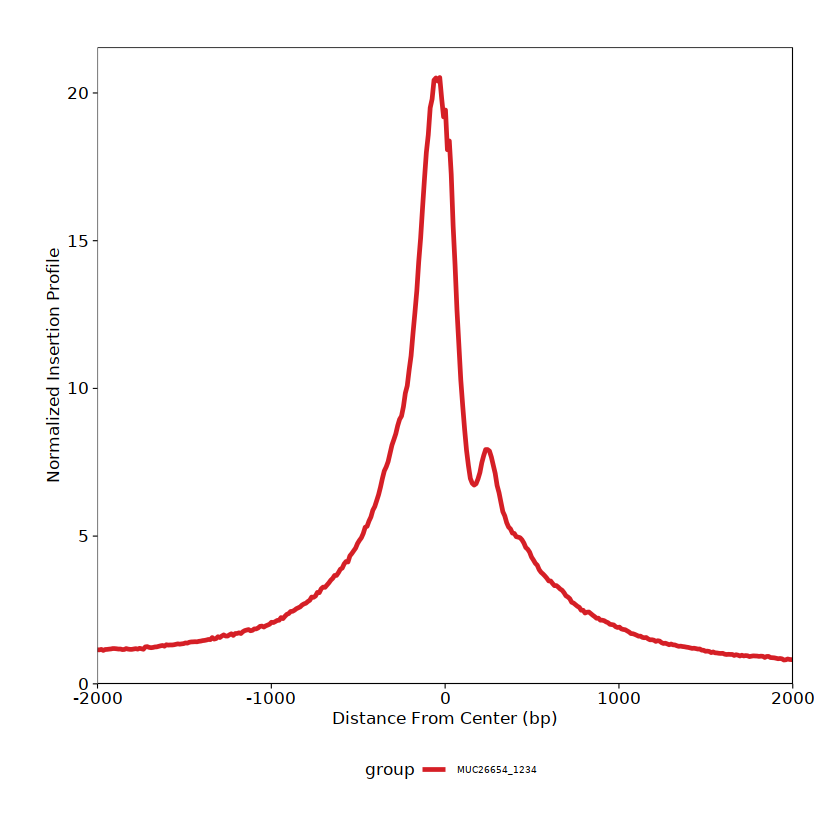

$MUC26649_1234

$MUC26651_1234

$MUC26650_1234

$MUC26652_1234

$MUC26654_1234

$MUC26655_1234

$MUC26653_1234


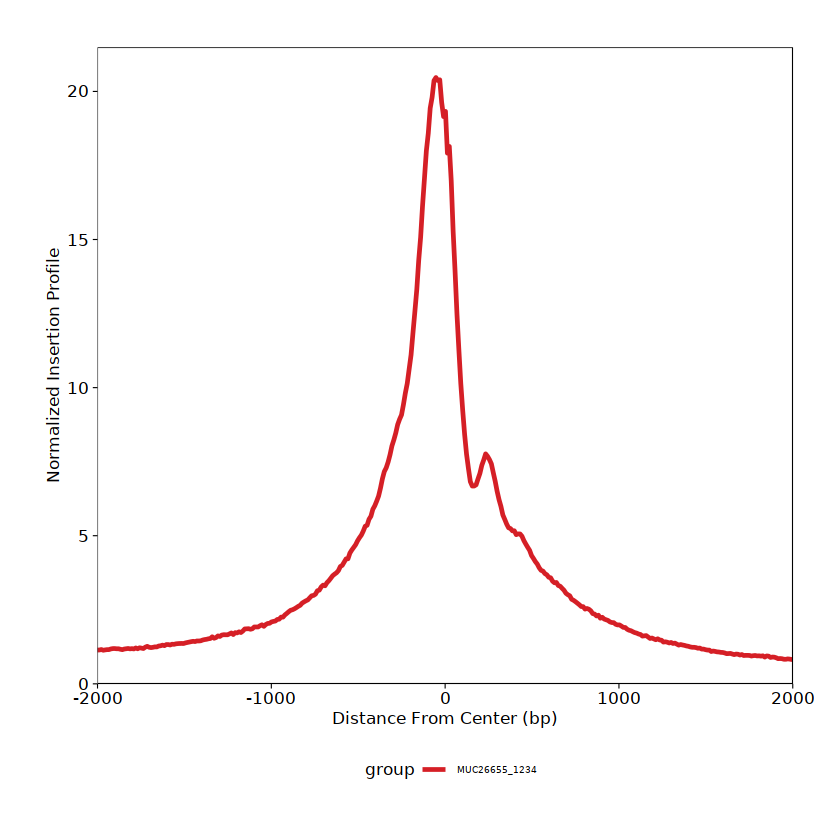

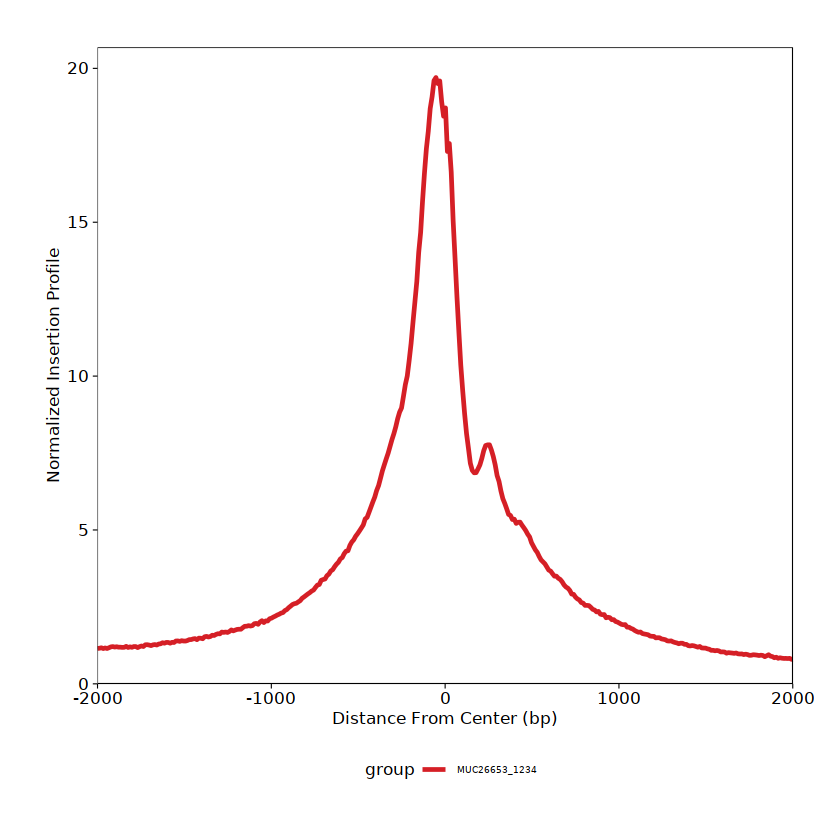

In [44]:
plots

## TSS enrichment over fragment count

In [33]:
df <- getCellColData(proj, select = c("log10(nFrags)", "TSSEnrichment"))
df

DataFrame with 147358 rows and 2 columns
                                 log10(nFrags) TSSEnrichment
                                     <numeric>     <numeric>
MUC26649_1234#ACTCGGGAGTTCCCGG-1       4.97130        13.452
MUC26649_1234#GATCGTAGTGATCAGG-1       4.93692        14.758
MUC26649_1234#ACGTTAGTCGTGTGCG-1       4.90784        13.942
MUC26649_1234#CATTCCGTCGAGAACG-1       4.89080        10.032
MUC26649_1234#GCGCCAAAGTCTCCAA-1       4.88305        13.629
...                                        ...           ...
MUC26655_1234#TACAGCAGTCTGCACG-1       2.47712         2.871
MUC26655_1234#TCACAGACACAATAAG-1       2.47712         3.663
MUC26655_1234#TCAGCTCTCGTGGAAG-1       2.47712         2.574
MUC26655_1234#TTAGCGATCGTTCTAT-1       2.47712         3.366
MUC26655_1234#TTGTTCAAGCAACTGG-1       2.47712         4.059

In [41]:
p <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 10, lty = "dashed") + geom_vline(xintercept = 3.5, lty = "dashed")

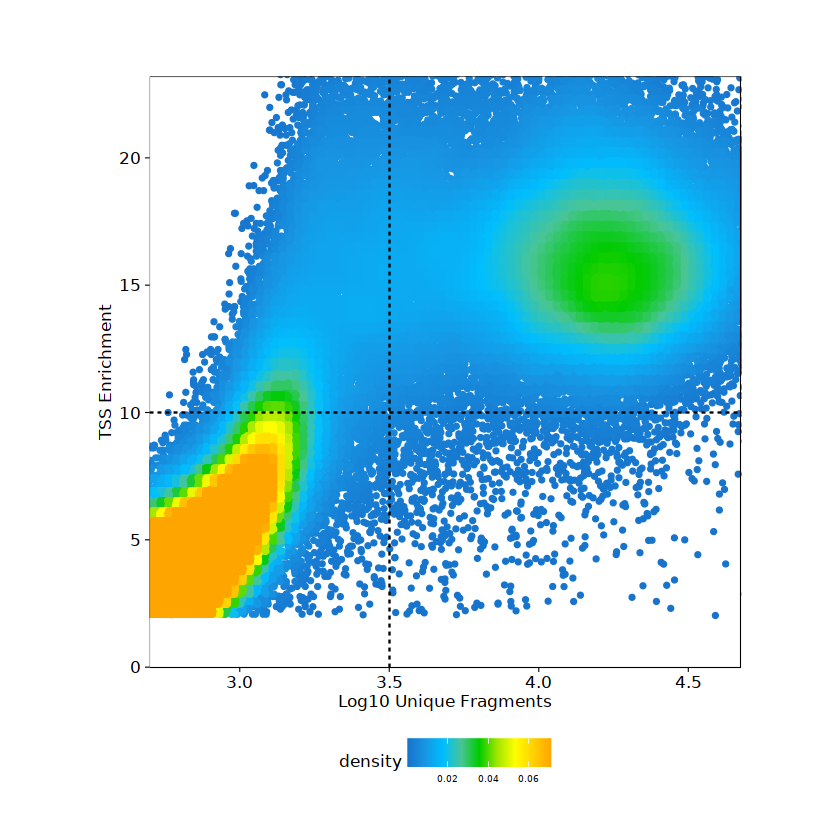

In [42]:
p

# Plot Cell embedding

In [ ]:
proj <- addIterativeLSI(ArchRProj = proj, useMatrix = "TileMatrix", name = "IterativeLSI")

proj <- addUMAP(ArchRProj = proj, reducedDims = "IterativeLSI")
p1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAP")

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-13a25a02849c-Date-2022-06-02_Time-15-43-13.log
If there is an issue, please report to github with logFile!

2022-06-02 15:43:19 : Computing Total Across All Features, 0.012 mins elapsed.

2022-06-02 15:43:38 : Computing Top Features, 0.342 mins elapsed.

###########
2022-06-02 15:43:40 : Running LSI (1 of 2) on Top Features, 0.375 mins elapsed.
###########

2022-06-02 15:43:41 : Sampling Cells (N = 10003) for Estimated LSI, 0.38 mins elapsed.

2022-06-02 15:43:41 : Creating Sampled Partial Matrix, 0.381 mins elapsed.

2022-06-02 15:44:04 : Computing Estimated LSI (projectAll = FALSE), 0.775 mins elapsed.

2022-06-02 15:45:04 : Identifying Clusters, 1.773 mins elapsed.

Warning message:
“package ‘Seurat’ was built under R version 4.1.3”
2022-06-02 15:45:58 : Identified 6 Clusters, 2.665 mins elapsed.

2022-06-02 15:45:58 : Saving LSI Iteration, 2.668 mins elapsed.

2022-06-02 15:46:38 : Creating Cluster Matrix on the

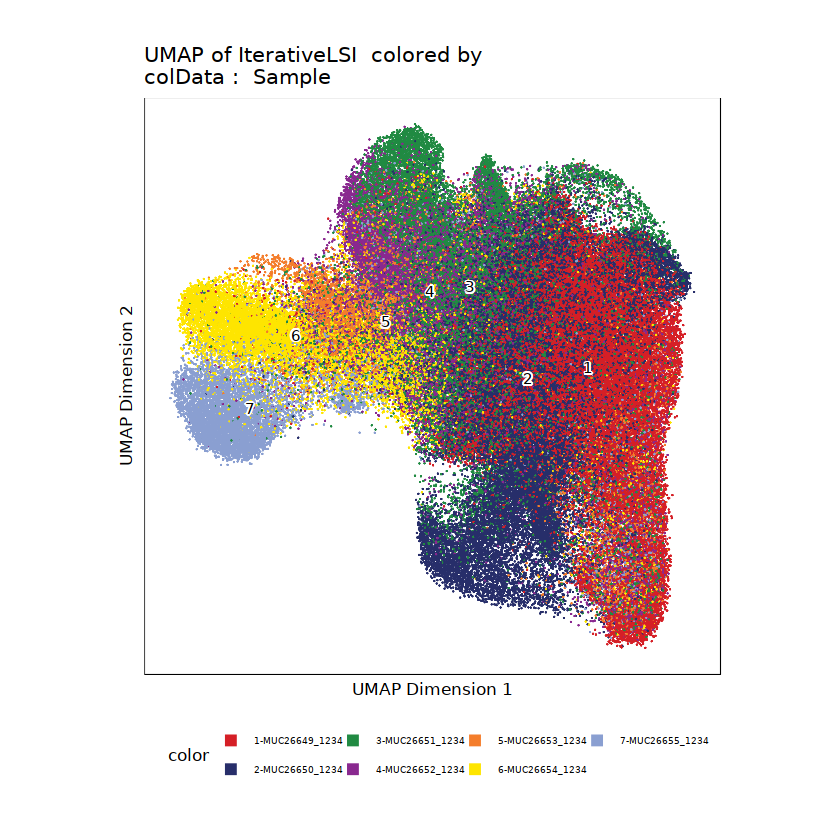

In [38]:
p1


In [49]:
p2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Clusters", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-326b4aa54780-Date-2022-05-27_Time-21-49-35.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-326b4aa54780-Date-2022-05-27_Time-21-49-35.log



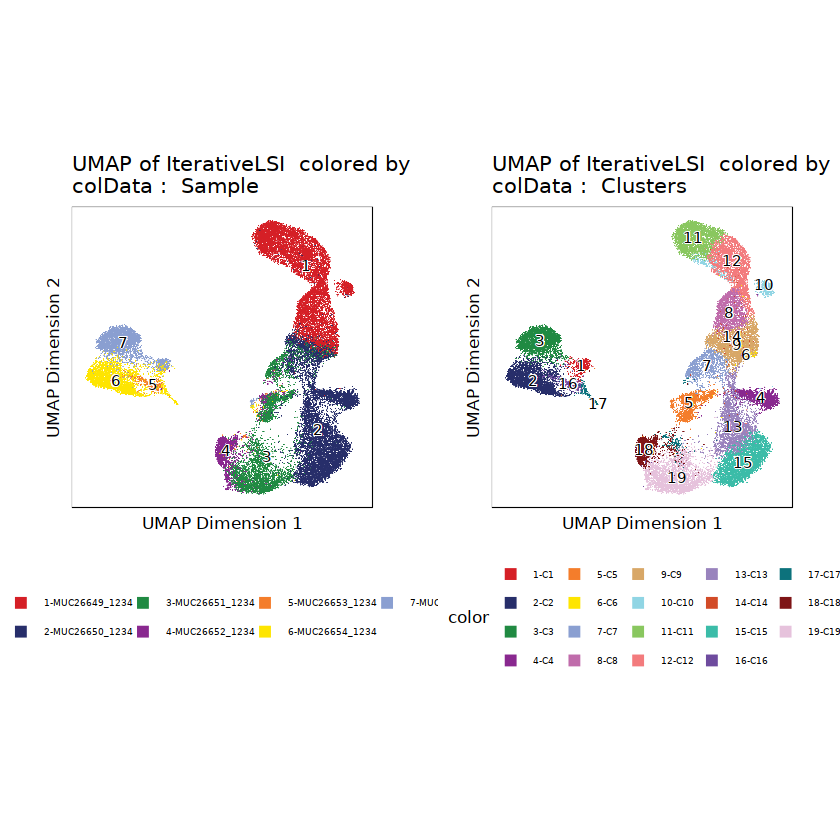

In [50]:
ggAlignPlots(p1, p2, type = "h")

In [51]:
plotPDF(p1,p2, name = "Plot-UMAP-Sample-Clusters.pdf",
        ArchRProj = proj, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!



In [11]:
proj <- saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

# Filter data

## Load filtered data

In [7]:
proj_filt <- loadArchRProject(path = paste0(data_path, "Epicardiods"))

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

## Plot embedding

In [8]:
proj_filt <- addUMAP(ArchRProj = proj_filt, reducedDims = "IterativeLSI", force=TRUE)
p1 <- plotEmbedding(ArchRProj = proj_filt, colorBy = "cellColData", name = "Sample", embedding = "UMAP")

10:30:19 UMAP embedding parameters a = 0.7669 b = 1.223

10:30:20 Read 43161 rows and found 30 numeric columns

10:30:20 Using Annoy for neighbor search, n_neighbors = 40

10:30:22 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:30:39 Writing NN index file to temp file /tmp/Rtmp603JfS/file694e1a22e6b0

10:30:39 Searching Annoy index using 16 threads, search_k = 4000

10:30:52 Annoy recall = 100%

10:30:52 Commencing smooth kNN distance calibration using 16 threads

10:30:56 Initializing from normalized Laplacian + noise

10:31:01 Commencing optimization for 200 epochs, with 2885824 positive edges

10:33:10 Optimization finished

10:33:11 Creating temp model dir /tmp/Rtmp603JfS/dir694e2af4eb1

10:33:11 Creating dir /tmp/Rtmp603JfS/dir694e2af4eb1

10:33:18 Changing to

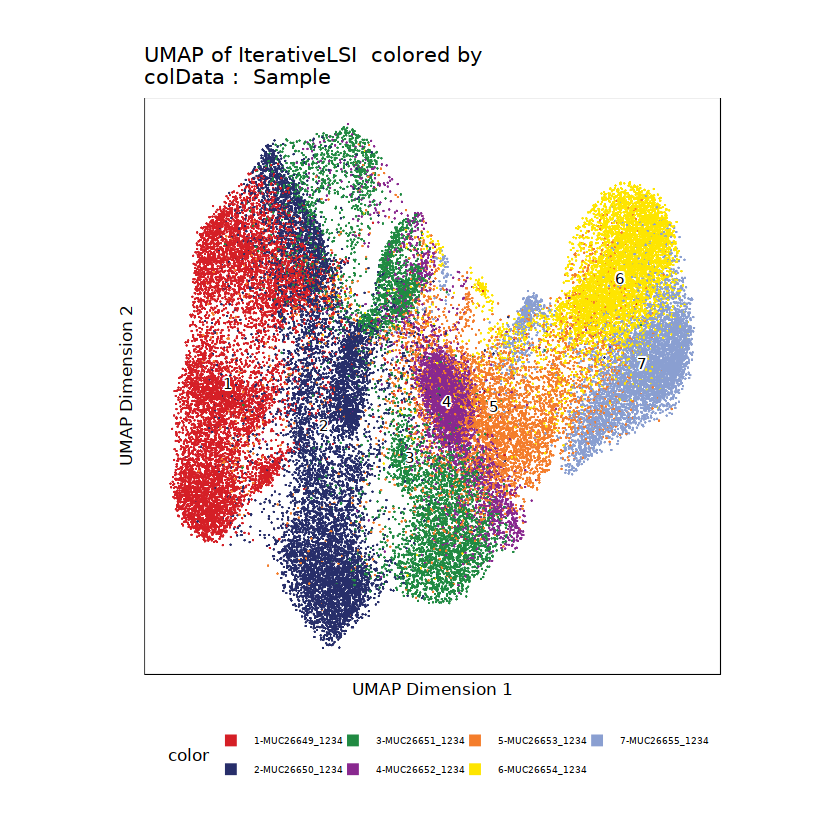

In [9]:
p1

In [10]:
p2 <- plotEmbedding(ArchRProj = proj_filt, colorBy = "cellColData", name = "DoubletEnrichment", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-694e13ddea14-Date-2022-06-16_Time-10-35-42.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-694e13ddea14-Date-2022-06-16_Time-10-35-42.log



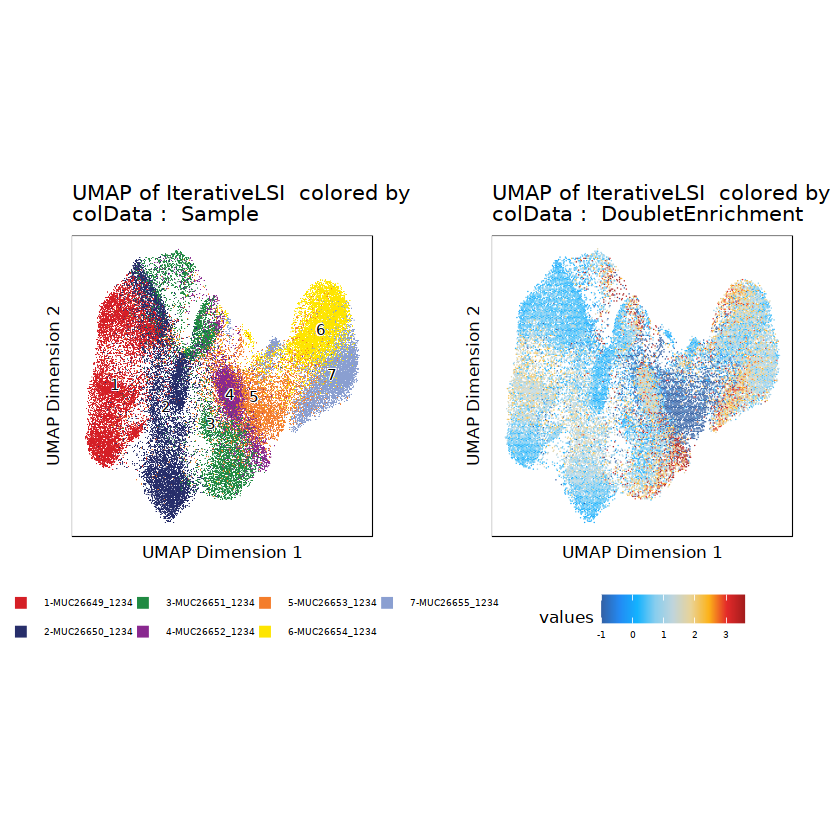

In [11]:
ggAlignPlots(p1, p2, type = "h")

In [13]:
p3 <- plotEmbedding(ArchRProj = proj_filt, colorBy = "cellColData", name = "log10(nFrags)", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-694e34e0993a-Date-2022-06-16_Time-10-40-16.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-694e34e0993a-Date-2022-06-16_Time-10-40-16.log



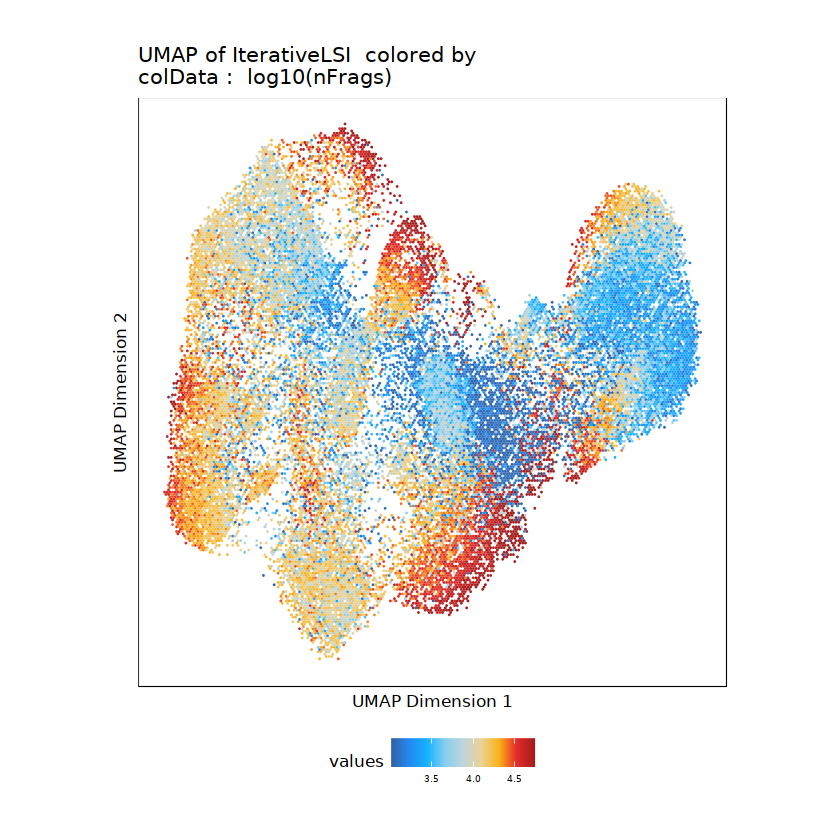

In [14]:
p3

## Apply old filtering

In [77]:
idxPass_unchanged <- which((proj_filt$Sample %in% c("MUC26653_1234", "MUC26654_1234", "MUC26655_1234")))

In [81]:
idxPass_filt <- which((!(proj_filt$Sample %in% c("MUC26653_1234", "MUC26654_1234", "MUC26655_1234"))) & (proj_filt$nFrags >= 10^(3.5)))

In [82]:
idxPass <- c(idxPass_filt, idxPass_unchanged)

In [84]:
cellsPass <- proj_filt$cellNames[idxPass]
proj <- proj_filt[cellsPass, ]

In [85]:
proj_filt


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /storage/groups/ml01/workspace/laura.martens/moretti_colab/archr_final/Epicardiods 
samples(7): MUC26649_1234 MUC26650_1234 ... MUC26654_1234 MUC26655_1234
sampleColData names(1): ArrowFiles
cellColData names(16): Sample TSSEnrichment ... BlacklistRatio Clusters
numberOfCells(1): 43161
medianTSS(1): 15.454
medianFrags(1): 9132

In [86]:
proj


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /storage/groups/ml01/workspace/laura.martens/moretti_colab/archr_final/Epicardiods 
samples(7): MUC26649_1234 MUC26650_1234 ... MUC26654_1234 MUC26655_1234
sampleColData names(1): ArrowFiles
cellColData names(16): Sample TSSEnrichment ... BlacklistRatio Clusters
numberOfCells(1): 39738
medianTSS(1): 15.6275
medianFrags(1): 10360

# Filter doublets

In [28]:
?filterDoublets

filterDoublets {ArchR},R Documentation
ArchRProj,An ArchRProject object.
cutEnrich,The minimum numeric cutoff for DoubletEnrichment. This number is equivalent to the number of simulated doublets identified as a nearest neighbor to the cell divided by the expected number given a random uniform distribution.
cutScore,The minimum numeric cutoff for DoubletScore which represents the -log10(binomial adjusted p-value) for the DoubletEnrichment.
filterRatio,"The maximum ratio of predicted doublets to filter based on the number of pass-filter cells. For example, if there are 5000 cells, the maximum would be filterRatio * 5000^2 / (100000) (which simplifies to filterRatio * 5000 * 0.05). This filterRatio allows you to apply a consistent filter across multiple different samples that may have different percentages of doublets because they were run with different cell loading concentrations. The higher the filterRatio, the greater the number of cells potentially removed as doublets."


In [87]:
proj_filt <- filterDoublets(proj_filt)

ERROR: Error in filterDoublets(proj_filt): Already ran filterDoublets on ArchRProject! Cannot be re-ran on an ArchRProject!


In [88]:
proj <- addIterativeLSI(ArchRProj = proj, useMatrix = "TileMatrix", name = "IterativeLSI", force=TRUE)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-694e4a1c37e7-Date-2022-06-16_Time-11-21-02.log
If there is an issue, please report to github with logFile!

2022-06-16 11:21:09 : Computing Total Across All Features, 0.02 mins elapsed.

2022-06-16 11:21:13 : Computing Top Features, 0.074 mins elapsed.

###########
2022-06-16 11:21:15 : Running LSI (1 of 2) on Top Features, 0.111 mins elapsed.
###########

2022-06-16 11:21:15 : Sampling Cells (N = 10002) for Estimated LSI, 0.114 mins elapsed.

2022-06-16 11:21:15 : Creating Sampled Partial Matrix, 0.114 mins elapsed.

2022-06-16 11:21:47 : Computing Estimated LSI (projectAll = FALSE), 0.648 mins elapsed.

2022-06-16 11:23:11 : Identifying Clusters, 2.04 mins elapsed.

2022-06-16 11:23:44 : Identified 6 Clusters, 2.589 mins elapsed.

2022-06-16 11:23:44 : Saving LSI Iteration, 2.592 mins elapsed.

2022-06-16 11:24:22 : Creating Cluster Matrix on the total Group Features, 3.225 mins elapsed.

2022-06-16 11:25:27 : Com

## Plot embedding

In [89]:
proj <- addUMAP(ArchRProj = proj, reducedDims = "IterativeLSI", force=TRUE)

11:27:55 UMAP embedding parameters a = 0.7669 b = 1.223

11:27:55 Read 39738 rows and found 30 numeric columns

11:27:55 Using Annoy for neighbor search, n_neighbors = 40

11:27:55 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

11:28:07 Writing NN index file to temp file /tmp/Rtmp603JfS/file694e27c9ecef

11:28:07 Searching Annoy index using 16 threads, search_k = 4000

11:28:15 Annoy recall = 100%

11:28:16 Commencing smooth kNN distance calibration using 16 threads

11:28:19 Initializing from normalized Laplacian + noise

11:28:25 Commencing optimization for 200 epochs, with 2429132 positive edges

11:30:17 Optimization finished

11:30:18 Creating temp model dir /tmp/Rtmp603JfS/dir694e8c39bd4

11:30:18 Creating dir /tmp/Rtmp603JfS/dir694e8c39bd4

11:30:24 Changing to

In [90]:
p1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-694e20479e04-Date-2022-06-16_Time-11-30-29.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-694e20479e04-Date-2022-06-16_Time-11-30-29.log



In [91]:
p2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "DoubletEnrichment", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-694e71f18d19-Date-2022-06-16_Time-11-30-41.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-694e71f18d19-Date-2022-06-16_Time-11-30-41.log



In [94]:
p3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "log10(nFrags)", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-694e10e475d0-Date-2022-06-16_Time-11-32-37.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-694e10e475d0-Date-2022-06-16_Time-11-32-37.log



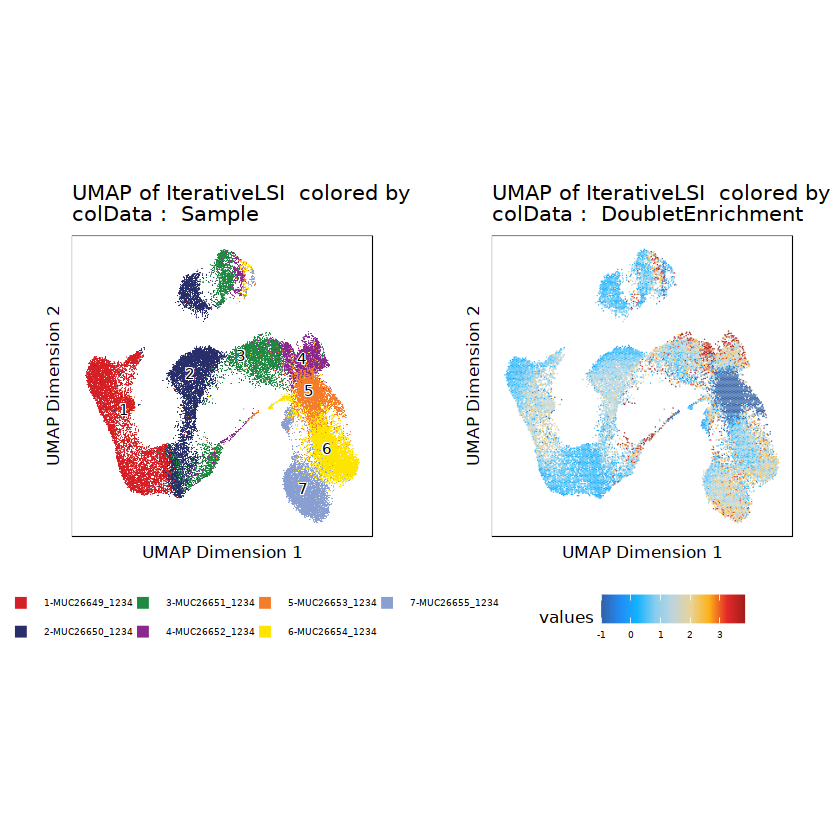

In [96]:
ggAlignPlots(p1, p2, type = "h")

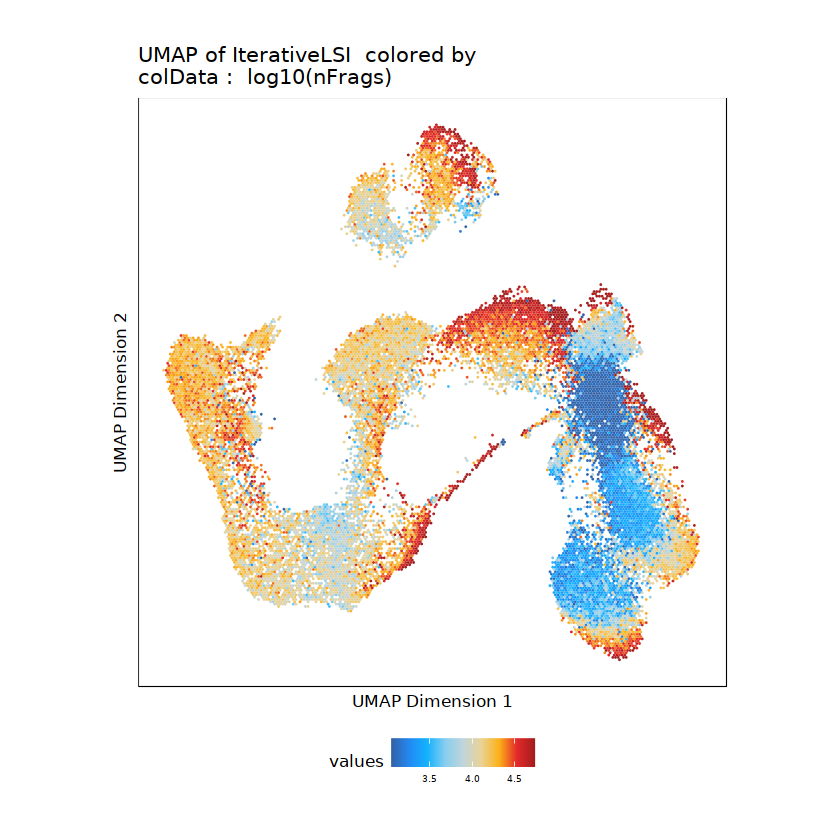

In [97]:
p3

In [103]:
saveArchRProject(ArchRProj = proj, load = FALSE)

Saving ArchRProject...



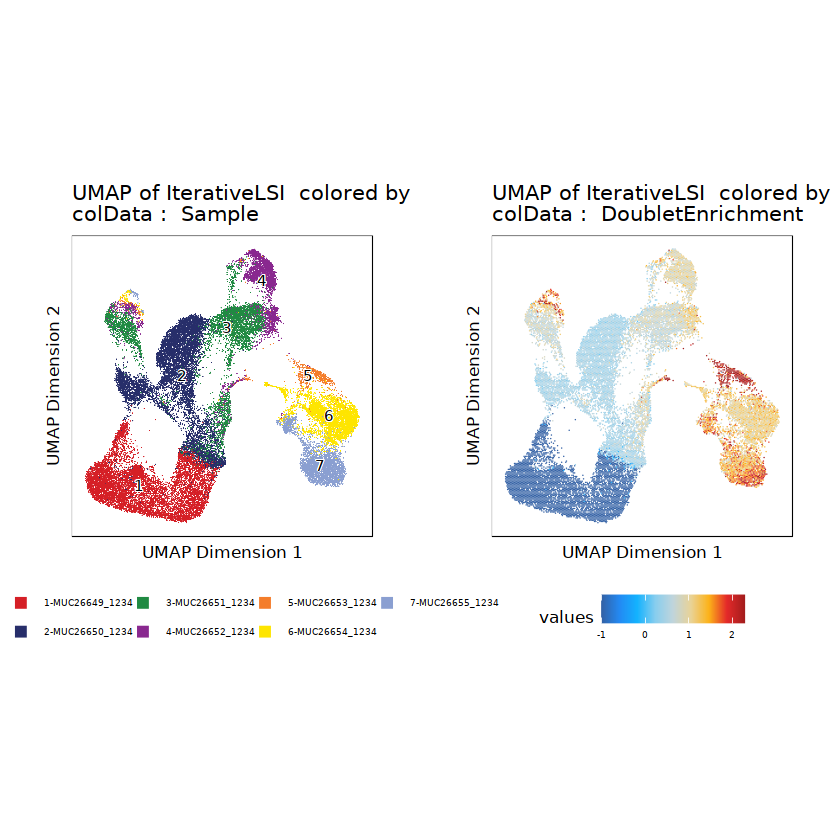

In [27]:
ggAlignPlots(p1, p2, type = "h")

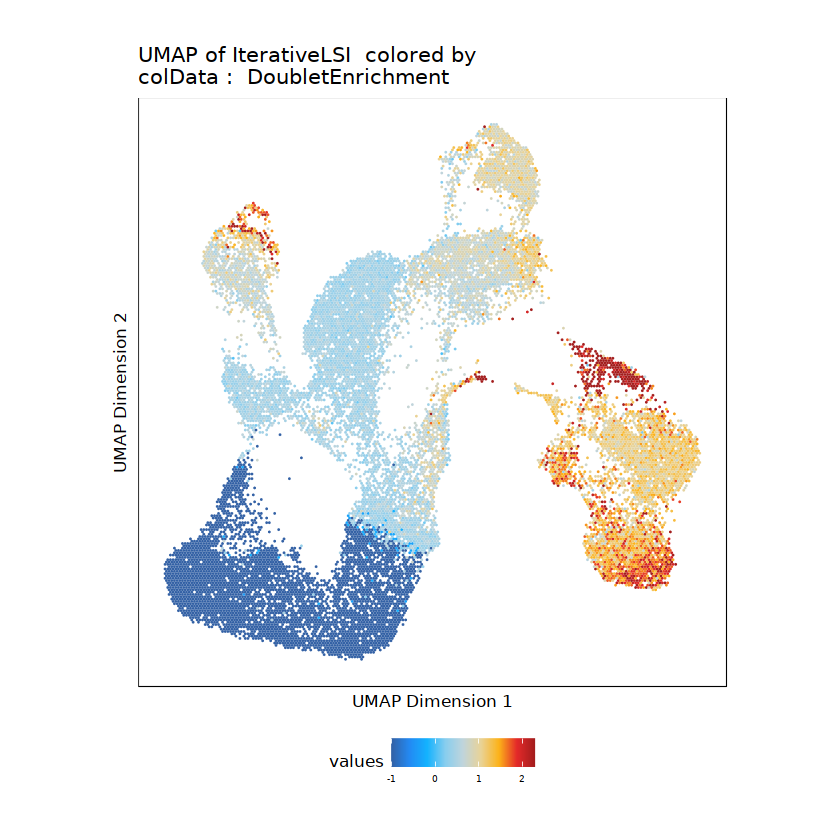

In [30]:
p2

In [31]:
p2 <- plotEmbedding(ArchRProj = proj_filt, colorBy = "cellColData", name = "TSSEnrichment", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3d17756142ea-Date-2022-06-03_Time-08-33-58.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3d17756142ea-Date-2022-06-03_Time-08-33-58.log



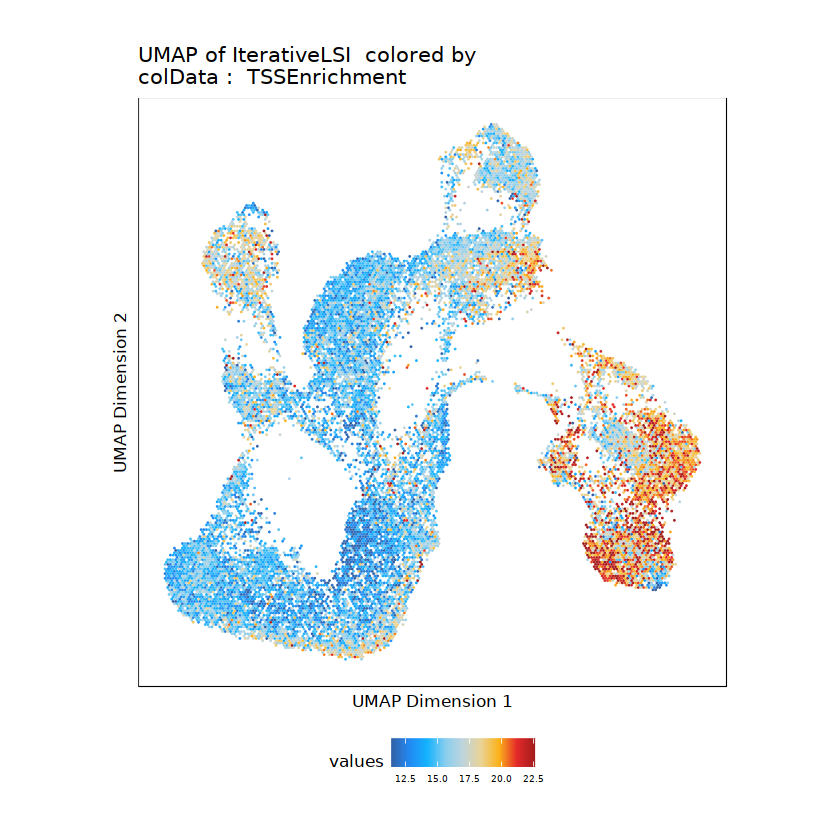

In [32]:
p2

In [33]:
p3 <- plotEmbedding(ArchRProj = proj_filt, colorBy = "cellColData", name = "log10(nFrags)", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3d1754d54e8b-Date-2022-06-03_Time-08-35-20.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3d1754d54e8b-Date-2022-06-03_Time-08-35-20.log



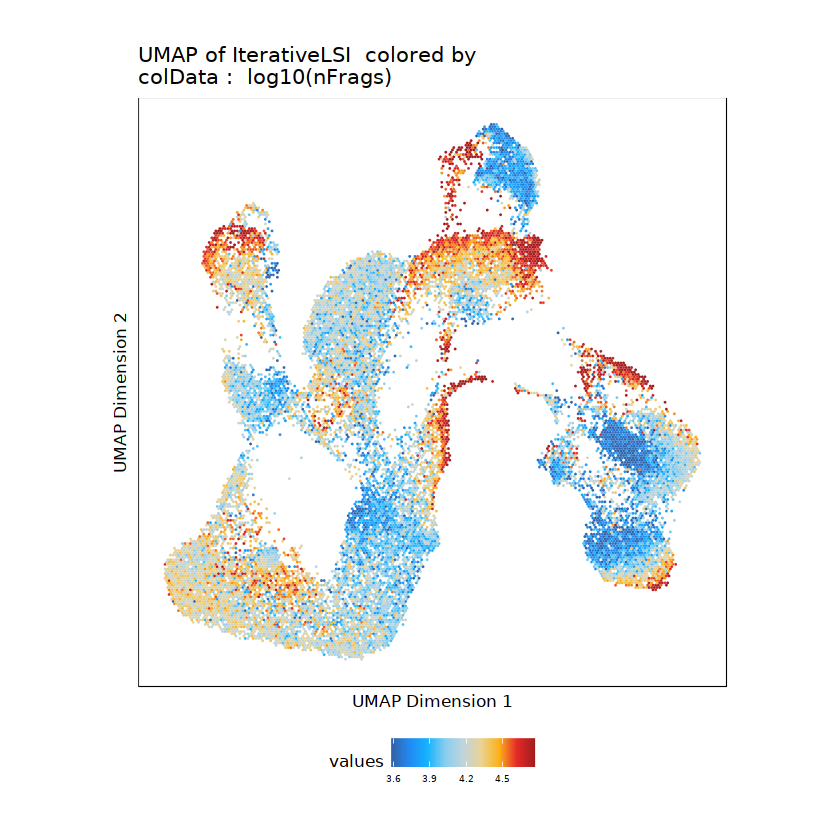

In [34]:
p3

In [99]:
getAvailableMatrices(proj)

[1] "GeneScoreMatrix" "TileMatrix"

In [100]:
matrix <- getMatrixFromProject(proj, useMatrix='GeneScoreMatrix')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-694e37616c9b-Date-2022-06-16_Time-12-07-41.log
If there is an issue, please report to github with logFile!

2022-06-16 12:11:01 : Organizing colData, 3.347 mins elapsed.

2022-06-16 12:11:02 : Organizing rowData, 3.352 mins elapsed.

2022-06-16 12:11:02 : Organizing rowRanges, 3.354 mins elapsed.

2022-06-16 12:11:02 : Organizing Assays (1 of 1), 3.356 mins elapsed.

2022-06-16 12:12:17 : Constructing SummarizedExperiment, 4.602 mins elapsed.

2022-06-16 12:12:19 : Finished Matrix Creation, 4.634 mins elapsed.



In [102]:
rowData(matrix)

DataFrame with 23127 rows and 6 columns
      seqnames     start       end  strand         name     idx
         <Rle>   <array>   <array> <array>      <array> <array>
1         chr1     11874     14409       1      DDX11L1       1
2         chr1     29961     14362       2       WASH7P       2
3         chr1     69091     70008       1        OR4F5       3
4         chr1    140566    134773       2    LOC729737       4
5         chr1    714068    700245       2 LOC100288069       5
...        ...       ...       ...     ...          ...     ...
23123     chrX 154299695 154351349       1        BRCC3     906
23124     chrX 154444701 154468098       1         VBP1     907
23125     chrX 154493852 154487526       2       RAB39B     908
23126     chrX 154563986 154505500       2        CLIC2     909
23127     chrX 154842622 154718673       2        TMLHE     910

# Call Peaks

In [8]:
pathToMacs2 <- findMacs2()

Searching For MACS2..

Found with $path!



In [9]:
proj <- addGroupCoverages(ArchRProj = proj, groupBy = "Clusters")

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-5b6fa656f00-Date-2022-06-19_Time-19-34-39.log
If there is an issue, please report to github with logFile!

C1 (1 of 17) : CellGroups N = 3

C2 (2 of 17) : CellGroups N = 3

C3 (3 of 17) : CellGroups N = 3

C4 (4 of 17) : CellGroups N = 3

C5 (5 of 17) : CellGroups N = 4

C6 (6 of 17) : CellGroups N = 5

C7 (7 of 17) : CellGroups N = 4

C8 (8 of 17) : CellGroups N = 3

C9 (9 of 17) : CellGroups N = 4

C10 (10 of 17) : CellGroups N = 2

C11 (11 of 17) : CellGroups N = 2

C12 (12 of 17) : CellGroups N = 2

C13 (13 of 17) : CellGroups N = 4

C14 (14 of 17) : CellGroups N = 3

C15 (15 of 17) : CellGroups N = 4

C16 (16 of 17) : CellGroups N = 3

C17 (17 of 17) : CellGroups N = 3

2022-06-19 19:35:00 : Creating Coverage Files!, 0.353 mins elapsed.

2022-06-19 19:35:00 : Batch Execution w/ safelapply!, 0.353 mins elapsed.

2022-06-19 20:02:14 : Adding Kmer Bias to Coverage Files!, 27.589 mins elapsed.

Completed Kmer Bias Calculation

Addin

In [10]:
proj <- addReproduciblePeakSet(
    ArchRProj = proj, 
    groupBy = "Clusters", 
    pathToMacs2 = pathToMacs2
)

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-5b6f50d7ec2a-Date-2022-06-19_Time-20-22-20.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2022-06-19 20:22:26 : Peak Calling Parameters!, 0.09 mins elapsed.



    Group nCells nCellsUsed nReplicates nMin nMax maxPeaks
C1     C1   5820       1037           3  223  500   150000
C2     C2   5190       1206           3  235  500   150000
C3     C3   2887        696           3   81  500   150000
C4     C4   1041       1032           3  284  435   150000
C5     C5   1596        855           4   62  500   150000
C6     C6   1417        982           5   43  500   150000
C7     C7    960        879           4   83  500   150000
C8     C8   2828        654           3   48  500   150000
C9     C9   2210       1422           4  141  500   150000
C10   C10    411        411           2   40  371   150000
C11   C11   2169        550           2   50  500   150000
C12   C12   2220        570           2   70  500   150000
C13   C13   3110       1318           4   45  500   150000
C14   C14    687        640           3   64  500   150000
C15   C15   2416        990           4   40  500   150000
C16   C16   1265        591           3   44  500   1500

2022-06-19 20:22:26 : Batching Peak Calls!, 0.099 mins elapsed.

2022-06-19 20:22:28 : Batch Execution w/ safelapply!, 0 mins elapsed.

2022-06-19 21:31:33 : Identifying Reproducible Peaks!, 69.215 mins elapsed.

2022-06-19 21:33:44 : Creating Union Peak Set!, 71.394 mins elapsed.

Converged after 8 iterations!

Plotting Ggplot!

2022-06-19 21:34:14 : Finished Creating Union Peak Set (416330)!, 71.895 mins elapsed.



In [ ]:
7

In [ ]:
proj <- addPeakMatrix(proj)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-5b6f14642b02-Date-2022-06-19_Time-21-34-14.log
If there is an issue, please report to github with logFile!

2022-06-19 21:34:16 : Batch Execution w/ safelapply!, 0 mins elapsed.



In [ ]:
saveArchRProject(ArchRProj = proj, load = TRUE)

# Save peak matrix

In [7]:
peaks <- getMatrixFromProject(proj, useMatrix='PeakMatrix')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-62617c2454a-Date-2022-06-19_Time-23-57-19.log
If there is an issue, please report to github with logFile!

2022-06-20 00:00:40 : Organizing colData, 3.354 mins elapsed.

2022-06-20 00:00:40 : Organizing rowData, 3.359 mins elapsed.

2022-06-20 00:00:40 : Organizing rowRanges, 3.362 mins elapsed.

2022-06-20 00:00:40 : Organizing Assays (1 of 1), 3.365 mins elapsed.

2022-06-20 00:01:48 : Constructing SummarizedExperiment, 4.495 mins elapsed.

2022-06-20 00:01:50 : Finished Matrix Creation, 4.534 mins elapsed.



In [26]:
chrom_assay <- CreateChromatinAssay(
  assays(peaks)$PeakMatrix,
  ranges=getPeakSet(proj),
genome = 'hg19'
)

In [32]:
adata <- CreateSeuratObject(
  counts = chrom_assay,
  assay = "peaks",
  metadata = colData(peaks)
)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from peaks to peaks_”


In [ ]:
saveRDS(adata, file = "/storage/groups/ml01/workspace/laura.martens/moretti_colab/signac/atac_archr.rds")

In [54]:
matrix <- getMatrixFromProject(proj, useMatrix='PeakMatrix')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-330cb3b316efe-Date-2022-06-20_Time-18-38-02.log
If there is an issue, please report to github with logFile!

2022-06-20 18:40:34 : Organizing colData, 2.526 mins elapsed.

2022-06-20 18:40:34 : Organizing rowData, 2.531 mins elapsed.

2022-06-20 18:40:34 : Organizing rowRanges, 2.533 mins elapsed.

2022-06-20 18:40:34 : Organizing Assays (1 of 1), 2.535 mins elapsed.

2022-06-20 18:41:00 : Constructing SummarizedExperiment, 2.972 mins elapsed.

2022-06-20 18:41:02 : Finished Matrix Creation, 2.995 mins elapsed.



In [56]:
writeMM(obj = assays(matrix)$PeakMatrix, file=paste0(data_path, "Epicardiods/", "matrix.mtx"))

NULL

In [57]:
obs <- getCellColData(ArchRProj = proj)

In [58]:
obs

DataFrame with 39738 rows and 19 columns
                                        Sample TSSEnrichment ReadsInTSS
                                   <character>     <numeric>  <numeric>
MUC26649_1234#ACTCGGGAGTTCCCGG-1 MUC26649_1234        13.452       9225
MUC26649_1234#GATCGTAGTGATCAGG-1 MUC26649_1234        14.758       8459
MUC26649_1234#ACGTTAGTCGTGTGCG-1 MUC26649_1234        13.942       8273
MUC26649_1234#GCGCCAAAGTCTCCAA-1 MUC26649_1234        13.629       7447
MUC26649_1234#AAATGAGCAACGGACA-1 MUC26649_1234        14.189       6757
...                                        ...           ...        ...
MUC26655_1234#GTTGGTAAGTATACCC-1 MUC26655_1234        10.891        110
MUC26655_1234#TATTGCTCAATTCGTG-1 MUC26655_1234        11.980        121
MUC26655_1234#TGTGGCGGTTGCAGCC-1 MUC26655_1234        12.970        131
MUC26655_1234#CCAGAATCAGTGCTCG-1 MUC26655_1234        11.782        119
MUC26655_1234#GCAGCTGAGATCGAGC-1 MUC26655_1234        10.693        108
                       

In [59]:
write.table(x = obs, file = paste0(data_path, "Epicardiods/", "obs.csv"), sep=",", col.names=TRUE, row.names=TRUE, quote=FALSE )

In [60]:
var <- getPeakSet(proj)

In [61]:
var

GRanges object with 416330 ranges and 13 metadata columns:
      seqnames              ranges strand |     score replicateScoreQuantile
         <Rle>           <IRanges>  <Rle> | <numeric>              <numeric>
   C4     chr1       761952-762452      * |   4.51585                  0.363
   C5     chr1       762677-763177      * |  75.74220                  0.988
  C13     chr1       766607-767107      * | 216.68600                  0.913
   C2     chr1       767460-767960      * |  12.82010                  0.812
   C7     chr1       779956-780456      * |  30.43570                  0.701
  ...      ...                 ...    ... .       ...                    ...
  C13     chrX 154996996-154997496      * | 325.82500                  0.940
   C9     chrX 154997892-154998392      * |   3.95652                  0.393
   C9     chrX 154999308-154999808      * |   5.26777                  0.493
   C4     chrX 155006613-155007113      * |   3.06260                  0.279
  C13     chrX 15

In [62]:
write.table(x = data.frame(var), file = paste0(data_path, "Epicardiods/", "var.csv"), sep=",", col.names=TRUE, row.names=TRUE, quote=FALSE )

# Gene score analysis

In [8]:
proj


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /storage/groups/ml01/workspace/laura.martens/moretti_colab/archr_final/Epicardiods 
samples(7): MUC26649_1234 MUC26650_1234 ... MUC26654_1234 MUC26655_1234
sampleColData names(1): ArrowFiles
cellColData names(18): Sample TSSEnrichment ... ReadsInPeaks FRIP
numberOfCells(1): 39738
medianTSS(1): 15.6275
medianFrags(1): 10360

In [42]:
p1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "day", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-330cb46d42628-Date-2022-06-20_Time-18-09-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-330cb46d42628-Date-2022-06-20_Time-18-09-55.log



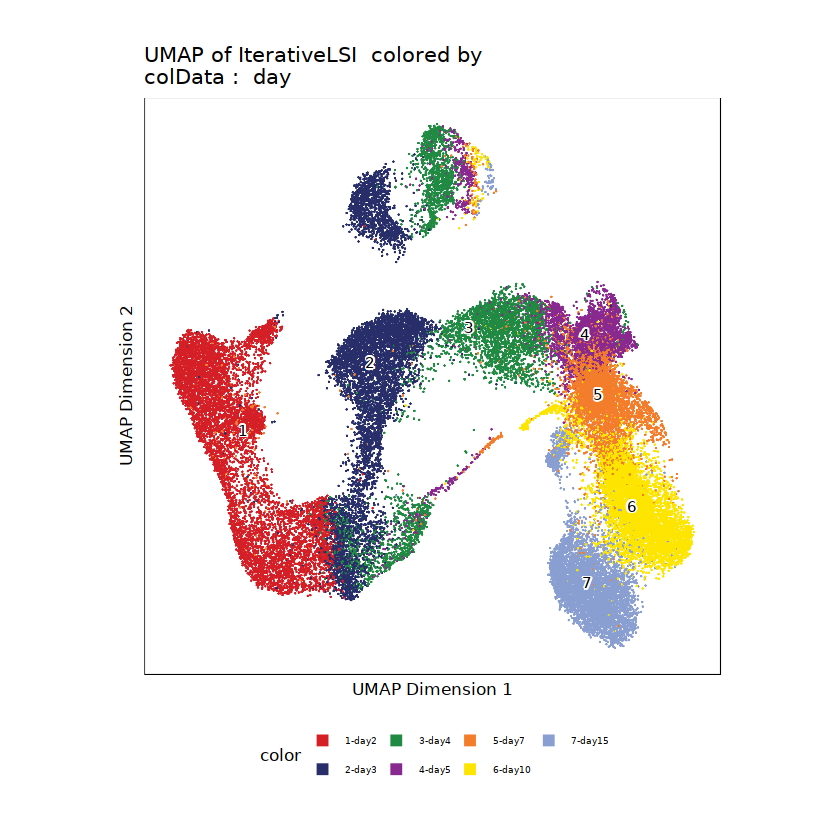

In [43]:
p1

In [45]:
p2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "DoubletEnrichment", embedding = "UMAP")
p3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "log10(nFrags)", embedding = "UMAP")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-330cb7519375a-Date-2022-06-20_Time-18-14-32.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-330cb7519375a-Date-2022-06-20_Time-18-14-32.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-330cb3870f6d-Date-2022-06-20_Time-18-14-42.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-330cb3870f6d-Date-2022-06-20_Time-18-14-42.log



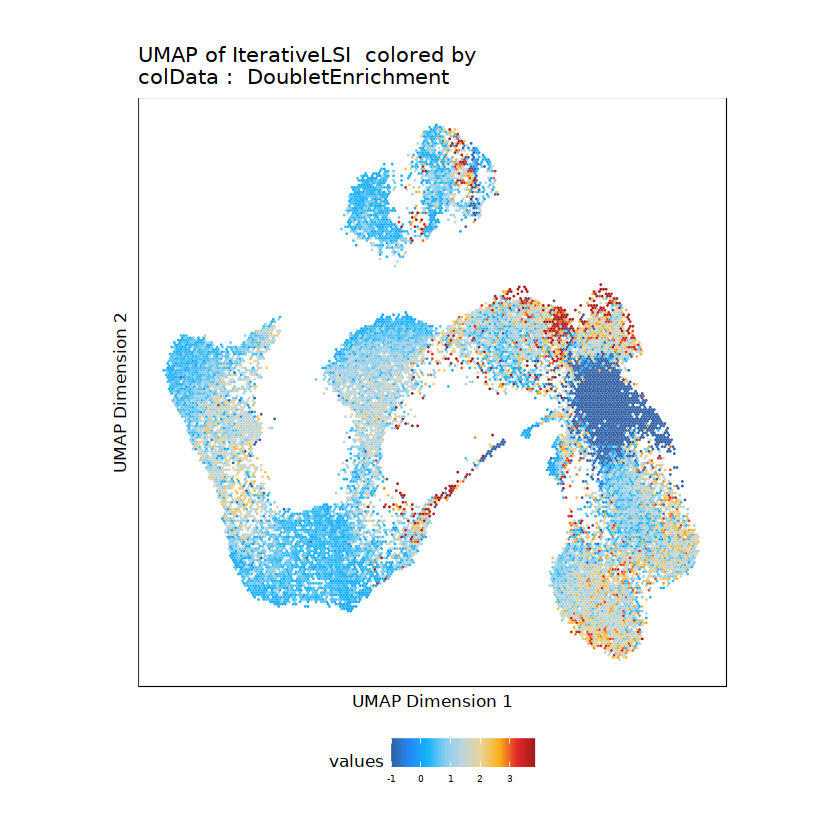

In [46]:
p2

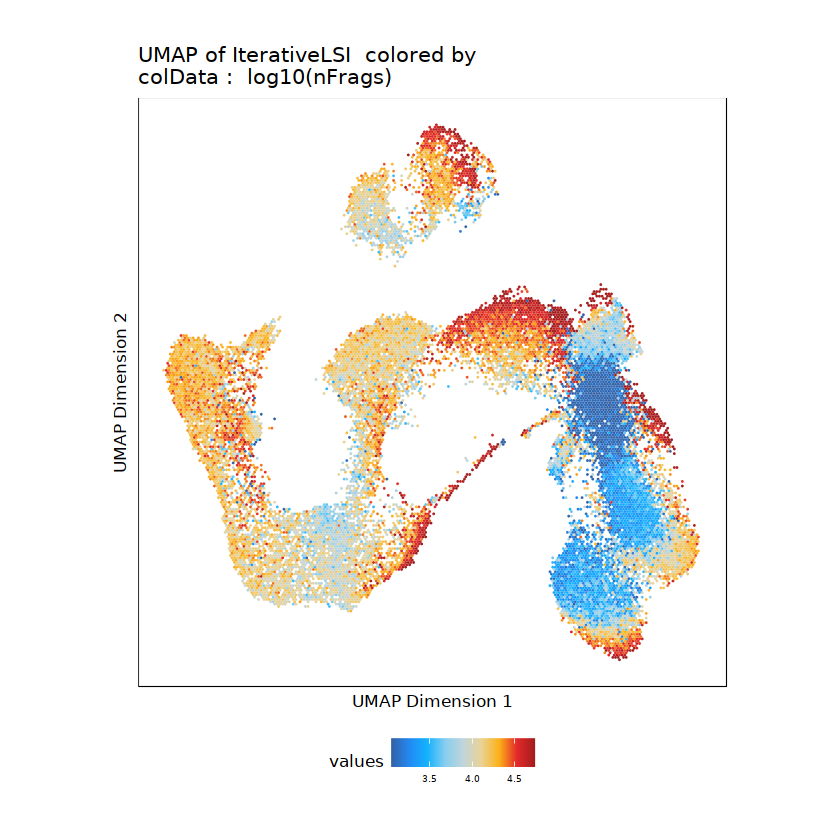

In [47]:
p3

## Compute clusters

In [9]:
proj <- addClusters(input = proj, reducedDims = "IterativeLSI", force=TRUE)

ArchR logging to : ArchRLogs/ArchR-addClusters-f36d68352060-Date-2022-06-20_Time-12-56-35.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Clusters

2022-06-20 12:56:44 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.035 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 39738
Number of edges: 1442325

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9072
Number of communities: 21
Elapsed time: 8 seconds


2 singletons identified. 19 final clusters.

2022-06-20 12:57:38 : Testing Biased Clusters, 0.945 mins elapsed.

2022-06-20 12:57:39 : Testing Outlier Clusters, 0.948 mins elapsed.

2022-06-20 12:57:39 : Assigning Cluster Names to 19 Clusters, 0.951 mins elapsed.

2022-06-20 12:57:39 : Finished addClusters, 0.955 mins elapsed.



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-27bd3b1cf853-Date-2022-06-20_Time-09-30-18.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-27bd3b1cf853-Date-2022-06-20_Time-09-30-18.log



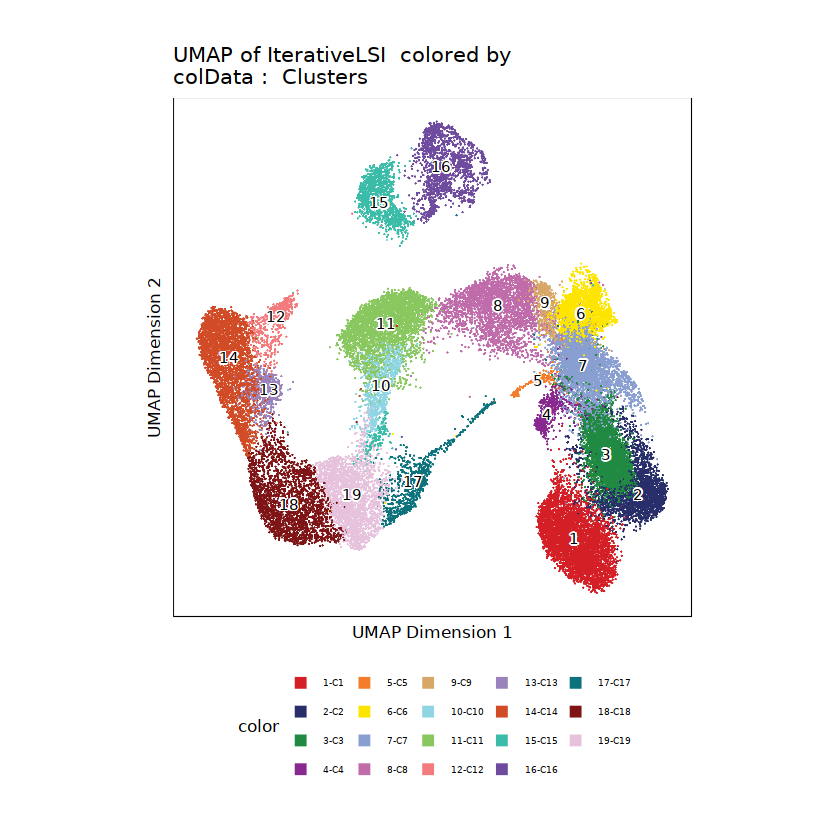

In [12]:
p2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Clusters", embedding = "UMAP")
p2

## Assigning Clusters with Gene Scores

In [50]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-330cb66856d80-Date-2022-06-20_Time-18-28-49.log
If there is an issue, please report to github with logFile!

2022-06-20 18:28:53 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


In [51]:
markerGenes  <- c(
    "MESP1", "PDGFRA", "BMP4",
    "TBX5", "SFRP5",
    "NKX2-5", "TTN", "MYL3", "MYL2",
    "HAND1", "HOXB6", "MAB21L2",
    "TCF21", "DCN", "MGP",
    "EMILIN1", "C7",
    "DDR2", "COL1A2", "TAGLN",
    "CDH5", "PLVAP",
    "FOXA2", "TTR",
    "TNNT2",
    "BNC1", "UPK3A",
    "ISL1", "PECAM1", "MYH6", "MYH7", "MYH11",
    "EOMES"
    
  )

In [23]:
library(stringr)
str_subset(getGenes(proj)$symbol, "UPK")

[1] "UPK1B"                  "DTX2P1-UPK3BP1-PMS2P11" "UPK2"                  
[4] "UPK1A"                  "UPK1A-AS1"              "UPK3A"

In [52]:
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(proj)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-330cb3a63be28-Date-2022-06-20_Time-18-30-04.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-06-20 18:30:11 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-330cb3a63be28-Date-2022-06-20_Time-18-30-04.log



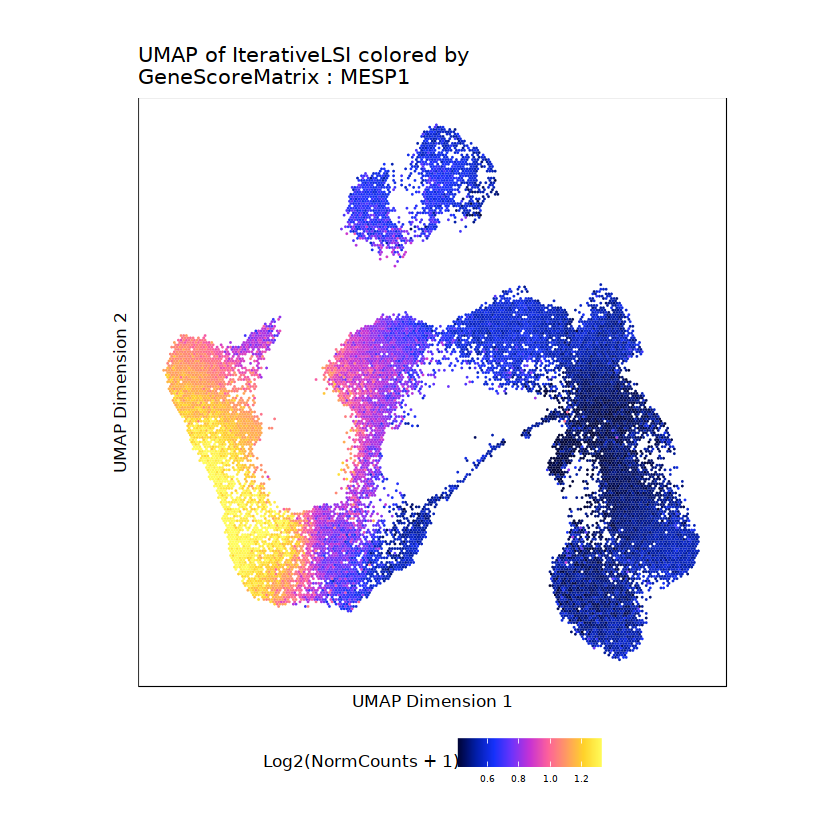

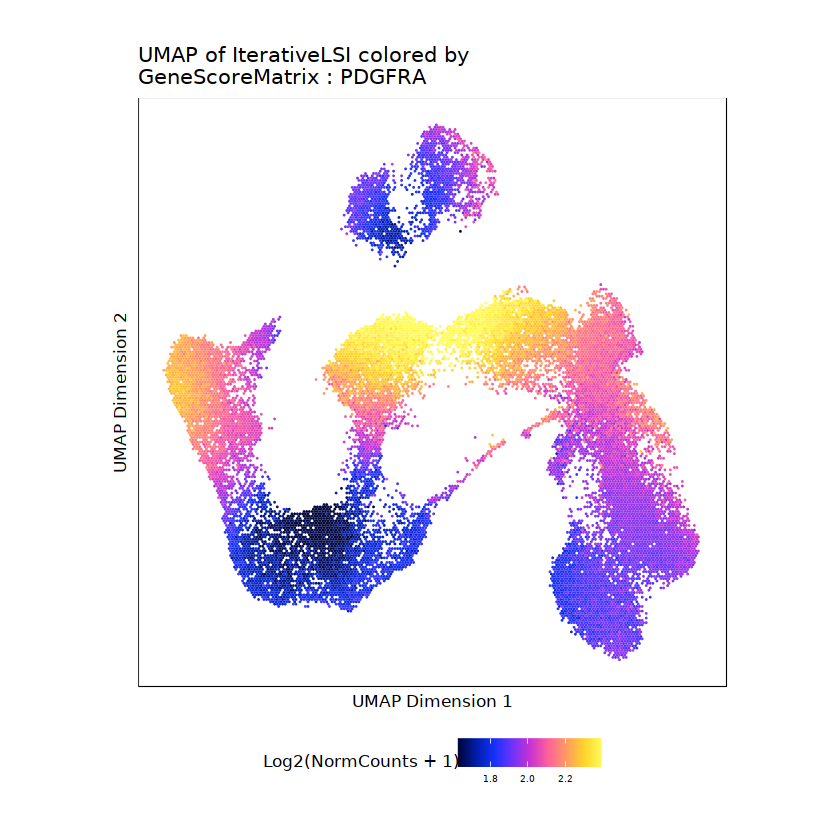

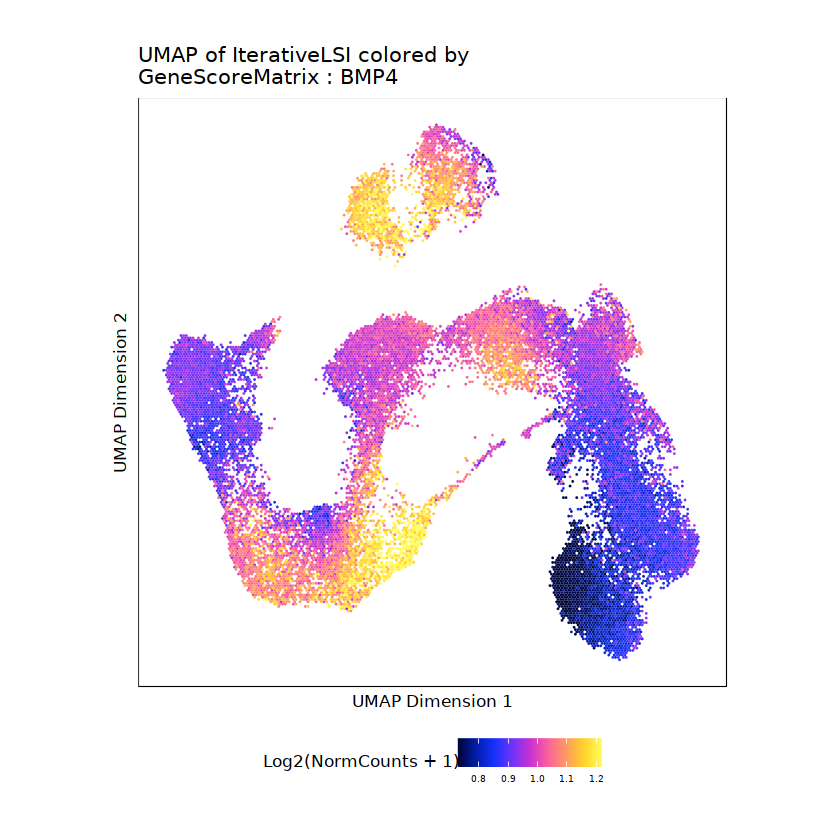

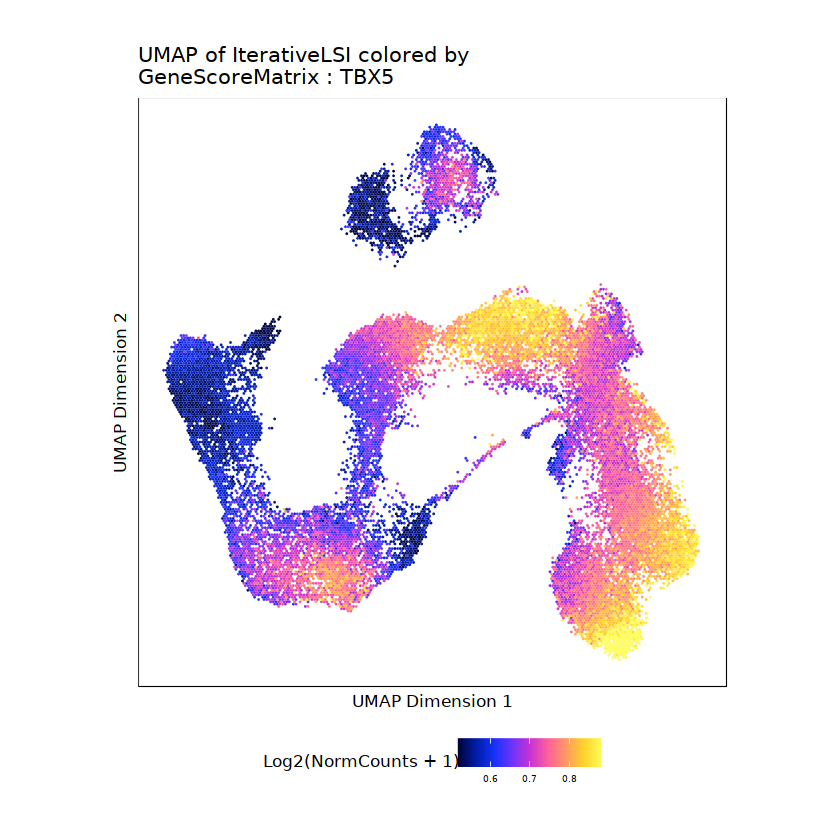

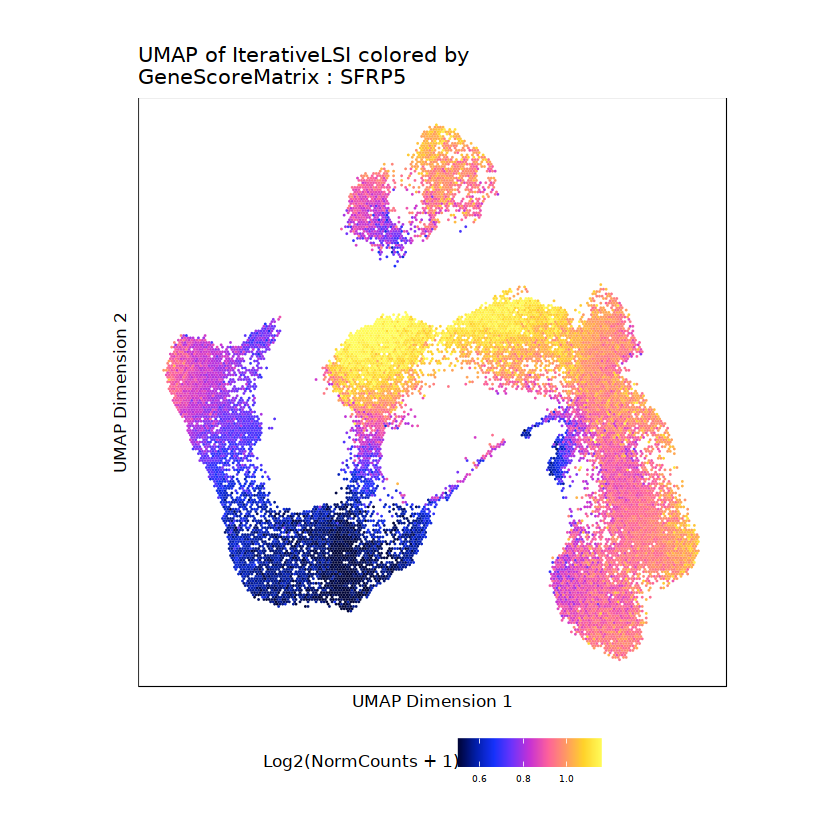

...

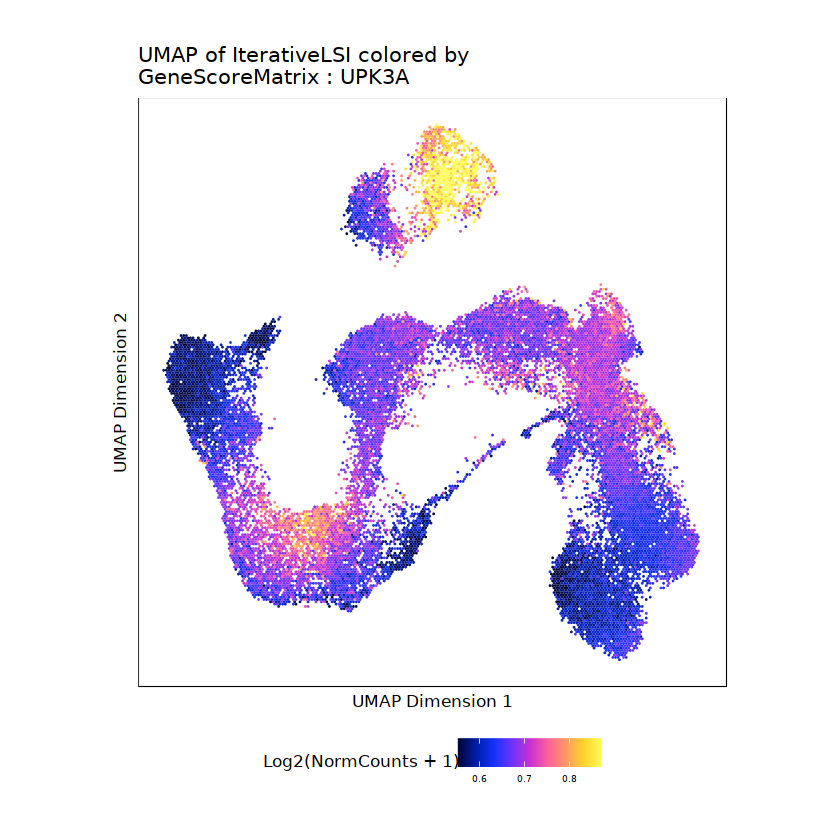

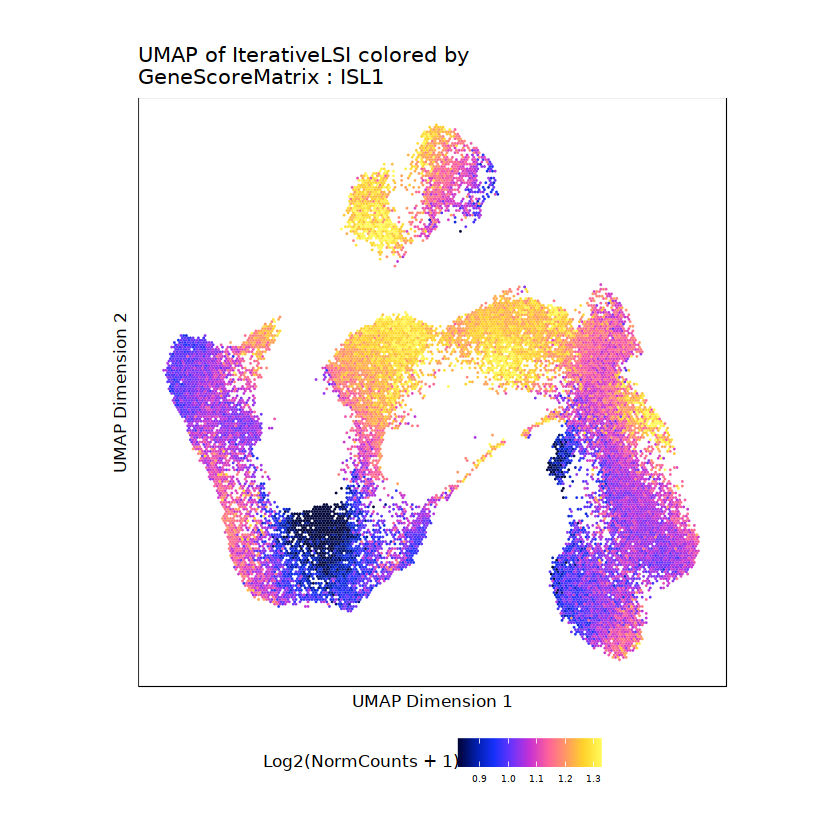

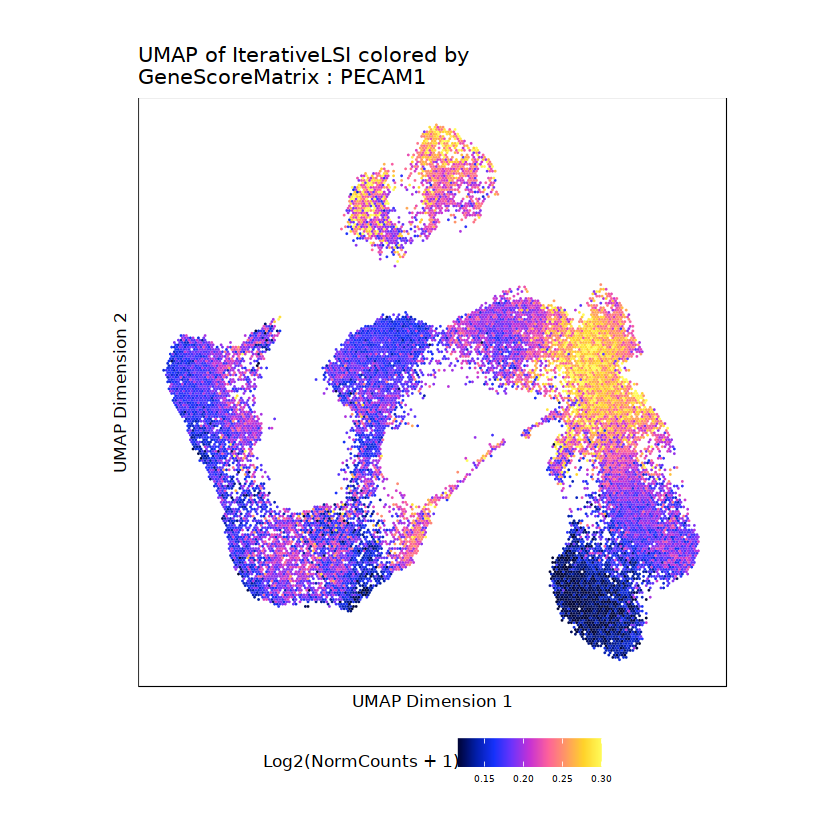

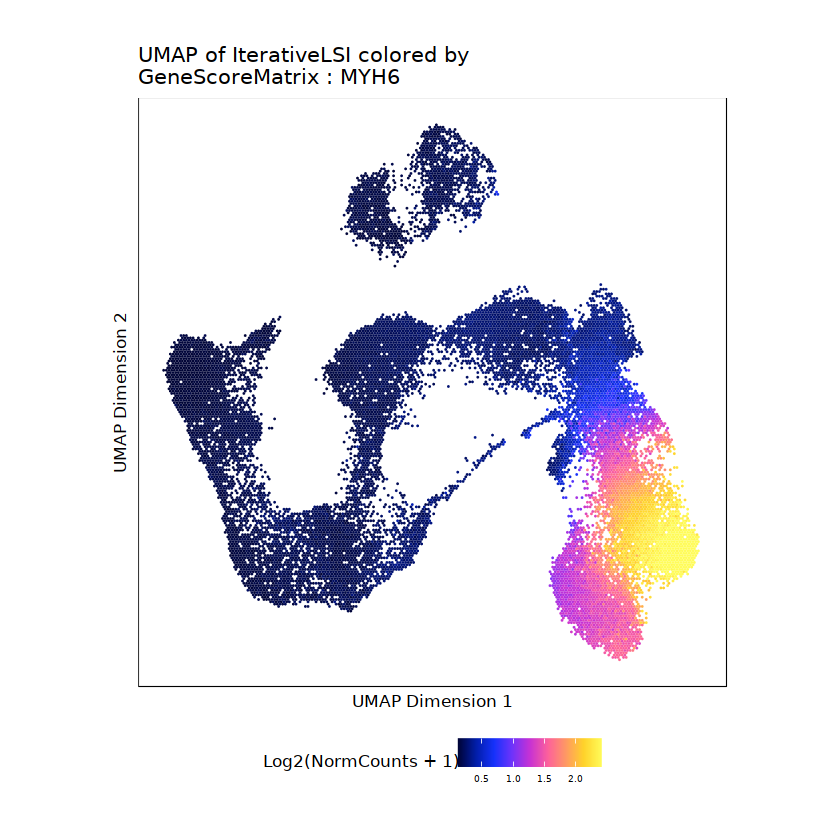

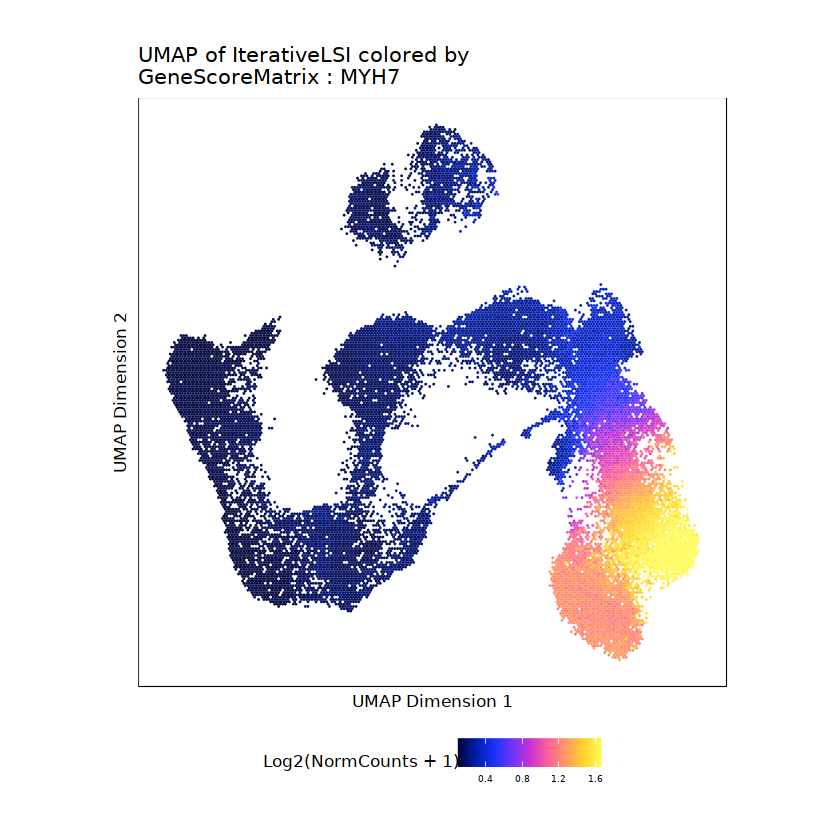

$MESP1

$PDGFRA

$BMP4

$TBX5

$SFRP5

$`NKX2-5`

$TTN

$MYL3

$MYL2

$HAND1

$HOXB6

$MAB21L2

$TCF21

$DCN

$MGP

$EMILIN1

$C7

$DDR2

$COL1A2

$TAGLN

$CDH5

$PLVAP

$FOXA2

$TTR

$TNNT2

$BNC1

$UPK3A

$ISL1

$PECAM1

$MYH6

$MYH7

$MYH11

$EOMES


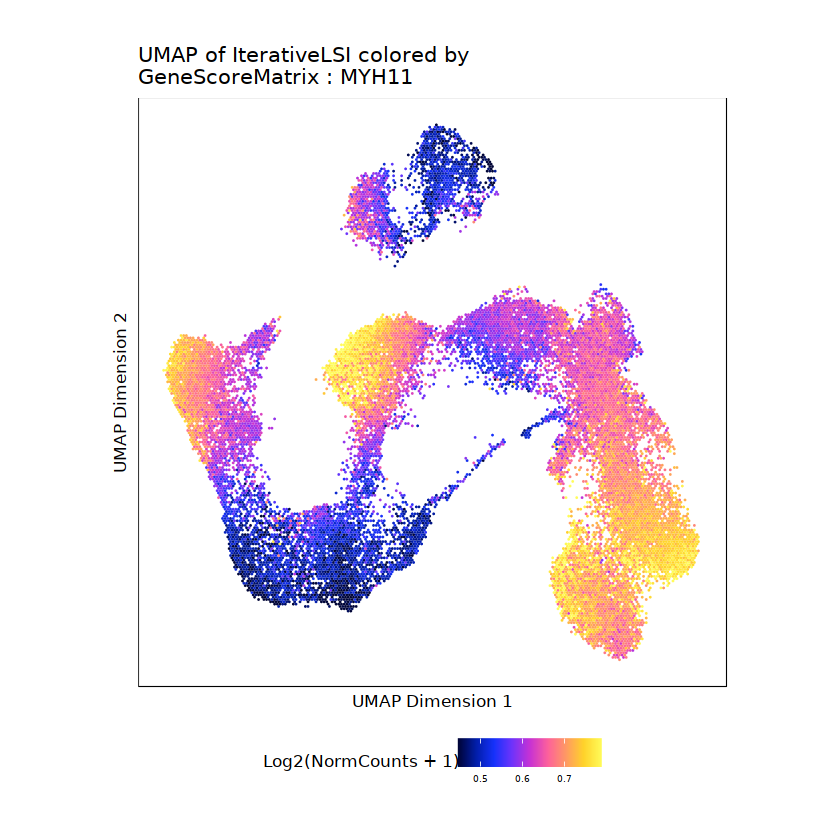

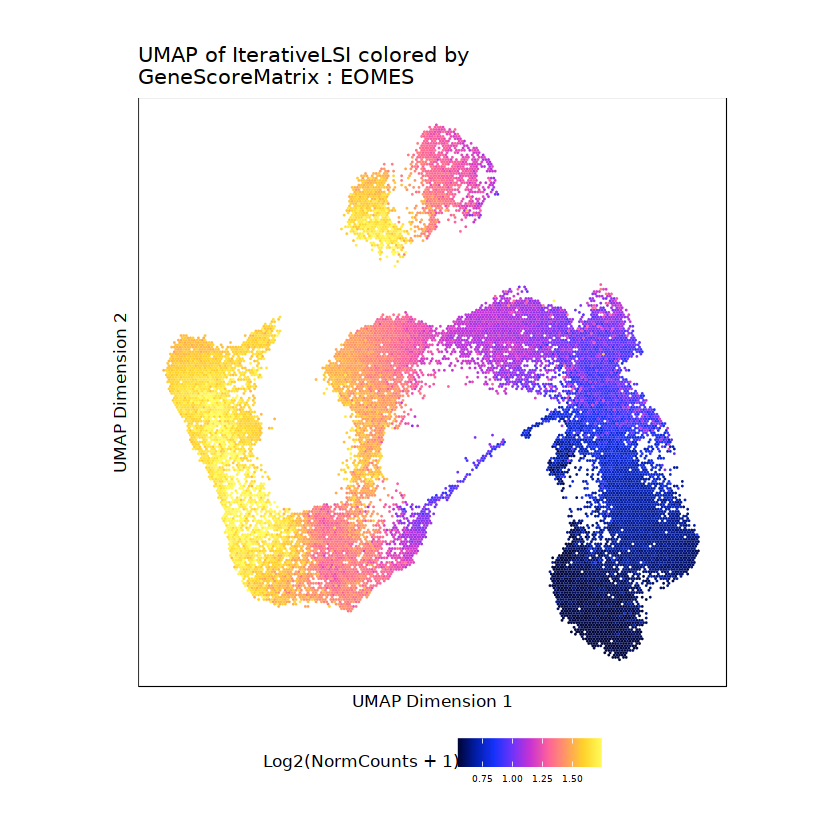

In [53]:
p

In [16]:
markersGS <- getMarkerFeatures(
    ArchRProj = proj, 
    useMatrix = "GeneScoreMatrix", 
    groupBy = "Clusters",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-6d33132d4b9e-Date-2022-06-17_Time-13-32-30.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2022-06-17 13:32:39 : Matching Known Biases, 0.013 mins elapsed.

###########
2022-06-17 13:46:17 : Completed Pairwise Tests, 13.651 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-6d33132d4b9e-Date-2022-06-17_Time-13-32-30.log



In [33]:
7

[1] 7

In [17]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")
markerList$C6

DataFrame with 4 rows and 9 columns
      seqnames     start       end  strand    name     idx    Log2FC        FDR
         <Rle>   <array>   <array> <array> <array> <array> <numeric>  <numeric>
6166     chr13  98829521  98828039       2 RNF113B     354   1.35584 0.00153222
8822     chr17   3213539   3214740       1  OR3A4P      63   1.53743 0.00646145
19052     chr6 116359894 116361107       1  TPI1P3     893   1.45924 0.00680764
8941     chr17   7328935   7330886       1   SPEM2     182   2.35754 0.00729966
       MeanDiff
      <numeric>
6166   0.175312
8822   0.184043
19052  0.187002
8941   0.147645

In [42]:
heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.01 & Log2FC >= 1.25", 
  transpose = TRUE,
  labelMarkers=markerGenes
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-6d331684e34f-Date-2022-06-17_Time-16-23-34.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

C1:

	NPPA-AS1, HSPB7, MIR378F, TRIM63, C1orf162, TSHB, SNHG28, VSIG8, FCRLA, GPR25, SNORA77, LINC00260, ACTN2, MT1HL1, FAM13C

C2:

	KISS1, GOLT1A, PITRM1-AS1, CWF19L1, SCT, CHRNA10, SNORA23, SAA2, TAGLN, LOC100652768, A2M, HIGD1C, NGDN, SNORD116-26, PRSS41

C3:

	MTOR-AS1, TCHHL1, AKR1C1, OPN4, CACNA1C-AS4, KRT75, ANKRD26P3, RNASE6, UBE2MP1, CDRT4, RINL, PSG2, DNAJC5G, CECR7, MIR4762

C4:

	HES4, SRSF10, RPS15AP10, MOB3C, UOX, AMY2A, HSD3BP4, ANKRD36BP1, DNM3OS, FAM133CP, ABCC2, ALKBH3-AS1, HRASLS2, MIR3165, ART4

C5:

	SNORA66, MIR942, OR10K2, OR6K3, LOC100505918, XCL2, PLA2G4A, MIR3123, MIR4676, DNMBP-AS1, MIR4295, TRIM34, OVCH2, C11orf74, OR5B3

C6:

	RNF113B, OR3A4P, SPEM2, TPI1P3, HES4, MMP23B, HES3, MTOR-AS1, NPPA-AS1, NPPA, AADACL3, HSPB7, PLA2G2A, CAMK2N1, CELA3B

C7:

	MIR125B1, COL3A1, MI

 [1] "MESP1"   "PDGFRA"  "BMP4"    "TBX5"    "SFRP5"   "NKX2-5"  "TTN"    
 [8] "MYL3"    "MYL2"    "HAND1"   "HOXB6"   "MAB21L2" "TCF21"   "DCN"    
[15] "MGP"     "EMILIN1" "C7"      "DDR2"    "COL1A2"  "TAGLN"   "CDH5"   
[22] "PLVAP"   "FOXA2"   "TTR"    


Adding Annotations..

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-6d331684e34f-Date-2022-06-17_Time-16-23-34.log



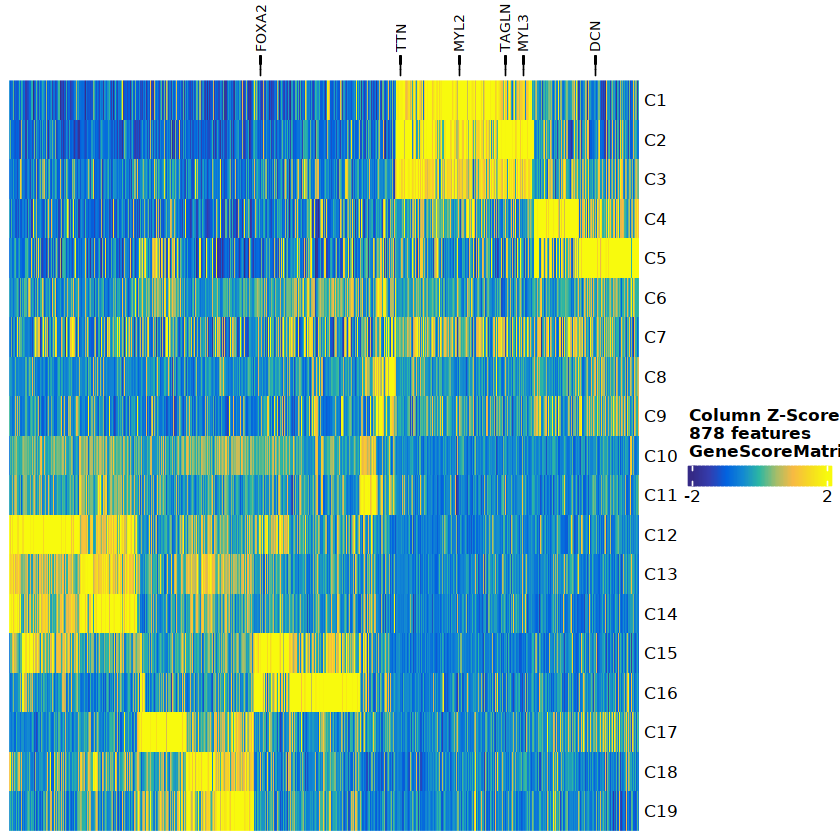

In [43]:
heatmapGS

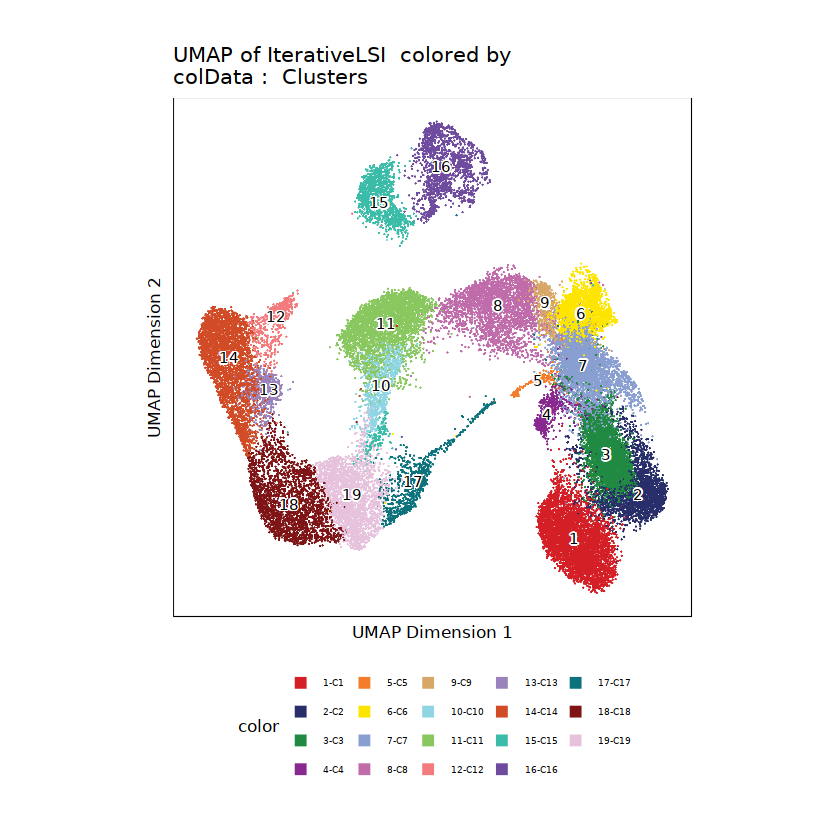

In [21]:
p2

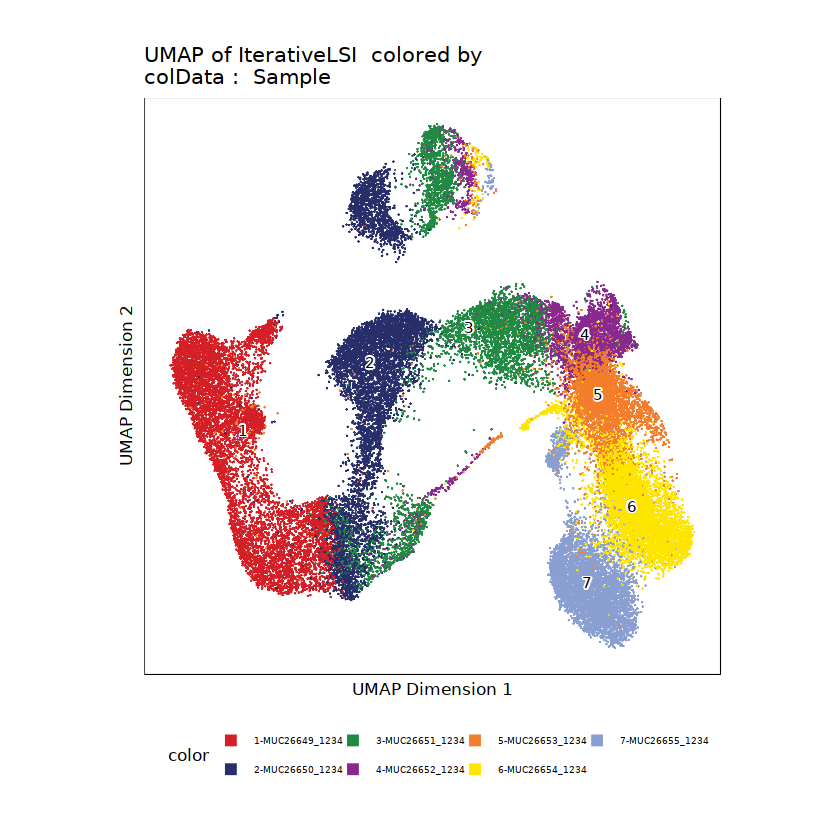

In [22]:
p1

## Plot marker heatmap

In [17]:
gene_activities <- getMatrixFromProject(proj, useMatrix='GeneScoreMatrix')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-27bd44f44f18-Date-2022-06-20_Time-09-35-01.log
If there is an issue, please report to github with logFile!

2022-06-20 09:38:16 : Organizing colData, 3.259 mins elapsed.

2022-06-20 09:38:17 : Organizing rowData, 3.263 mins elapsed.

2022-06-20 09:38:17 : Organizing rowRanges, 3.264 mins elapsed.

2022-06-20 09:38:17 : Organizing Assays (1 of 1), 3.265 mins elapsed.

2022-06-20 09:39:24 : Constructing SummarizedExperiment, 4.388 mins elapsed.

2022-06-20 09:39:26 : Finished Matrix Creation, 4.425 mins elapsed.



In [20]:
gene_activities

class: SummarizedExperiment 
dim: 23127 39738 
metadata(0):
assays(1): GeneScoreMatrix
rownames: NULL
rowData names(6): seqnames start ... name idx
colnames(39738): MUC26649_1234#ACTCGGGAGTTCCCGG-1
  MUC26649_1234#GATCGTAGTGATCAGG-1 ... MUC26653_1234#ATTACTCAGTCGAAAT-1
  MUC26653_1234#TAAACCGGTAGAAAGG-1
colData names(18): BlacklistRatio DoubletEnrichment ... ReadsInPeaks
  FRIP

In [ ]:
colData()

In [31]:
?CreateSeuratObject

reexports {Seurat},R Documentation


In [22]:
mat <- assays(gene_activities)$GeneScoreMatrix

In [27]:
rownames(mat) <- rowData(gene_activities)$name

In [35]:
gene_scores <- CreateSeuratObject(mat)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [36]:
gene_scores

An object of class Seurat 
23127 features across 39738 samples within 1 assay 
Active assay: RNA (23127 features, 0 variable features)

In [37]:
clusters <- colData(gene_activities)$Clusters

In [39]:
names(clusters) <- colnames(x = gene_scores)

In [44]:
gene_scores <- AddMetaData(
  object = gene_scores,
  metadata = clusters,
  col.name = 'Clusters'
)

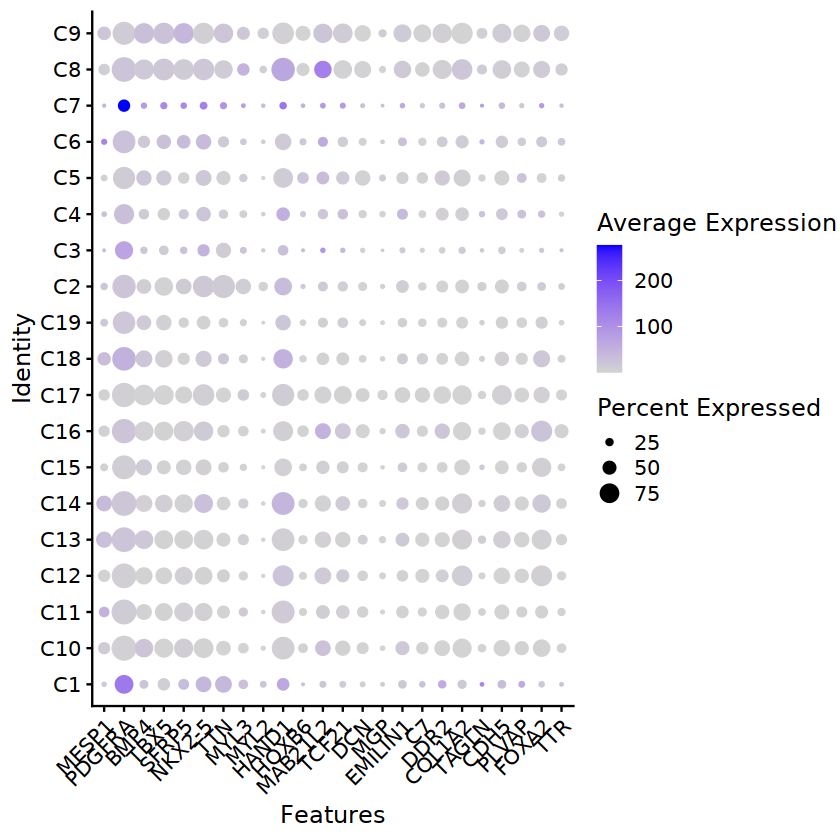

In [50]:
# Dot plots - the size of the dot corresponds to the percentage of cells expressing the
# feature in each cluster. The color represents the average expression level
DotPlot(gene_scores, features = markerGenes, group.by="Clusters", col.max=50, scale=FALSE) + RotatedAxis()

In [ ]:
plotGroups(proj,)

In [47]:
?DotPlot

DotPlot {Seurat},R Documentation
object,Seurat object
assay,"Name of assay to use, defaults to the active assay"
features,"Input vector of features, or named list of feature vectors if feature-grouped panels are desired (replicates the functionality of the old SplitDotPlotGG)"
cols,"Colors to plot: the name of a palette from RColorBrewer::brewer.pal.info, a pair of colors defining a gradient, or 3+ colors defining multiple gradients (if split.by is set)"
col.min,Minimum scaled average expression threshold (everything smaller will be set to this)
col.max,Maximum scaled average expression threshold (everything larger will be set to this)
dot.min,The fraction of cells at which to draw the smallest dot (default is 0). All cell groups with less than this expressing the given gene will have no dot drawn.
dot.scale,"Scale the size of the points, similar to cex"
idents,Identity classes to include in plot (default is all)
group.by,Factor to group the cells by
